<a href="https://colab.research.google.com/github/rll/deepul/blob/master/homeworks/hw4/hw4_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting Started

## Overview
This semester, all homeworks will be conducted through Google Colab notebooks. All code for the homework assignment will be written and run in this notebook. Running in Colab will automatically provide a GPU, but you may also run this notebook locally by following [these instructions](https://research.google.com/colaboratory/local-runtimes.html) if you wish to use your own GPU.

You will save images in the notebooks to use and fill out a given LaTeX template which will be submitted to Gradescope, along with your notebook code.

## Using Colab
On the left-hand side, you can click the different icons to see a Table of Contents of the assignment, as well as local files accessible through the notebook.

Make sure to go to **Runtime -> Change runtime type** and select **GPU** as the hardware accelerator. This allows you to use a GPU. Run the cells below to get started on the assignment. Note that a session is open for a maximum of 12 hours, and using too much GPU compute may result in restricted access for a short period of time. Please start the homework early so you have ample time to work.

**If you loaded this notebook from clicking "Open in Colab" from github, you will need to save it to your own Google Drive to keep your work.**

## General Tips
In each homework problem, you will implement a GAN model and run it on a dataset. We provide the expected outputs to help as a sanity check.

Feel free to print whatever output (e.g. debugging code, training code, etc) you want, as the graded submission will be the submitted pdf with images.

After you complete the assignment, download all of the image outputted in the results/ folder and upload them to the figure folder in the given latex template.

Run the cells below to download and load up the starter code.

In [ ]:
!if [ -d deepul ]; then rm -Rf deepul; fi
!git clone https://github.com/rll/deepul.git 
!pip install ./deepul
# !pip install pytorch_lightning

Cloning into 'deepul'...
remote: Enumerating objects: 749, done.
remote: Total 749 (delta 0), reused 0 (delta 0), pack-reused 749
Receiving objects: 100% (749/749), 114.90 MiB | 28.08 MiB/s, done.
Resolving deltas: 100% (344/344), done.
Checking out files: 100% (129/129), done.
Processing ./deepul
  Created wheel for deepul: filename=deepul-0.1.0-cp36-none-any.whl size=16678 sha256=b92fa6b593e8e206c0807681e8e1845ca0a7d9bf5869d336bb4f94d26dac7006
  Stored in directory: /tmp/pip-ephem-wheel-cache-nn438yax/wheels/39/1a/4b/a6f51db275abb2e5dae32540e06ed5011e792f162467bd3aa8
Successfully built deepul


In [ ]:
from deepul.hw4_helper import *
import deepul.pytorch_util as ptu
import warnings
warnings.filterwarnings('ignore')
ptu.set_gpu_mode(True)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils import data
import numpy as np
# import pytorch_lightning as pl
# from pytorch_lightning import Trainer
from torch.autograd import Variable
from tqdm import trange, tqdm_notebook
torch.autograd.set_detect_anomaly(True)

# Question 1: Warmup [20pt]

In this question, we will train 2 different variants of GANs on an easy 1D dataset. 

Execute the cell below to visualize our datasets.

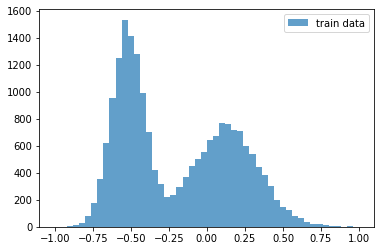

In [ ]:
visualize_q1_dataset()

## Part 1(a)
In this part, we'll train our generator and discriminator via the original minimax GAN objective:
<insert GAN Objective here>
$$min_{G} max_{D} \mathbb{E}_{x \sim p_{data}} [\log D(x)] + \mathbb{E}_{z \sim p(z)}[\log (1-D(G(z)))]$$

Use an MLP for both your generator and your discriminator, and train until the generated distribution resembles the target distribution. 



In [ ]:
class Generator(nn.Module):
  def __init__(self, input_size, hidden_sizes):
    super().__init__()
    self.input_size = input_size

    assert len(hidden_sizes) > 0
    self.hidden_sizes = hidden_sizes

    self.net = nn.ModuleList([nn.Linear(input_size, hidden_sizes[0]), nn.LeakyReLU(0.2)])
    for i in range(1, len(hidden_sizes)):
      self.net.append(nn.Linear(hidden_sizes[i-1], hidden_sizes[i]))
      self.net.append(nn.LeakyReLU(0.2))

    self.net.append(nn.Linear(hidden_sizes[-1], input_size))
    self.net.append(nn.Tanh()) # output E (-1, 1)

    

  # sample from a standard normal dist
  def forward(self, batch_size):
    z = torch.randn(batch_size, self.input_size)
    
    for layer in self.net:
      z = layer(z)

    return z

class Discriminator(nn.Module):
  def __init__(self, hidden_sizes, input_size = 1):
    super().__init__()

    self.input_size = input_size
    assert len(hidden_sizes) > 0

    self.hidden_sizes = hidden_sizes

    self.net = nn.ModuleList([nn.Linear(input_size, hidden_sizes[0]), nn.LeakyReLU(0.2)])

    for i in range(1, len(hidden_sizes)):
      self.net.append(nn.Linear(hidden_sizes[i-1], hidden_sizes[i]))
      self.net.append(nn.LeakyReLU(0.2))

    self.net.append(nn.Linear(hidden_sizes[-1], input_size))
    self.net.append(nn.Sigmoid()) # output E (0, 1)

  def forward(self, x):
    out = x.float()
    for layer in self.net:
      out = layer(out)
    return out

class GAN(pl.LightningModule):
  def __init__(self, hidden_d, hidden_g, input_dim = 1):
    super().__init__()
    self.input_dim = input_dim
    self.hidden_d = hidden_d
    self.hidden_g = hidden_g

    self.generator = Generator(input_size = 1, hidden_sizes = hidden_g)
    self.discriminator = Discriminator(hidden_sizes = hidden_d, input_size = input_dim)

    self.train_loss = []
    self.gen_sample_1 = []
    self.disc_sample_1 = []


  def configure_optimizers(self):
    return torch.optim.Adam(self.discriminator.parameters(), lr = 1e-4), torch.optim.Adam(self.generator.parameters(), lr=1e-4)

  def training_step(self, batch, batch_idx, optimizer_idx):

    batch_size = len(batch)

    gen_out = self.generator(batch_size)
    disc_out = self.discriminator(batch)
    disc_gen_out = self.discriminator(gen_out)

    # backprop thru discriminator
    if optimizer_idx == 0:
      loss = -1*(torch.log(disc_out) + torch.log(1.0 - disc_gen_out)).mean()
      result = pl.TrainResult(minimize=loss)
      result.log('disc_loss', loss, prog_bar=True)
      self.train_loss.append(loss.item())
      return result

    # backprop thru generator
    if optimizer_idx == 1 and batch_idx%2 == 0:
      loss = torch.log(1.0 - disc_gen_out).mean()
      result = pl.TrainResult(minimize=loss)
      result.log('gen_loss', loss, prog_bar=True)
      return result

  def training_epoch_end(self, training_step_output_result):
    # print(self.current_epoch)
    if self.current_epoch == 1:
      
      linspace_samples = torch.from_numpy(np.linspace(-1, 1, num=1000)).to(self.device).view(1000,1)
      self.disc_sample_1 = self.discriminator(linspace_samples).cpu().detach().numpy()

      self.gen_sample_1 = self.generator(5000).cpu().detach().numpy()     

    return {}



  

### Solution

In [ ]:
def q1_a(train_data):
  """
  train_data: An (20000, 1) numpy array of floats in [-1, 1]

  Returns
  - a (# of training iterations,) numpy array of discriminator losses evaluated every minibatch
  - a numpy array of size (5000,) of samples drawn from your model at epoch #1
  - a numpy array of size (1000,) linearly spaced from [-1, 1]; hint: np.linspace
  - a numpy array of size (1000,), corresponding to the discriminator output (after sigmoid) 
      at each location in the previous array at epoch #1

  - a numpy array of size (5000,) of samples drawn from your model at the end of training
  - a numpy array of size (1000,) linearly spaced from [-1, 1]; hint: np.linspace
  - a numpy array of size (1000,), corresponding to the discriminator output (after sigmoid) 
      at each location in the previous array at the end of training
  """

  
  train_data_loader = data.DataLoader(dataset = train_data, batch_size = 128, shuffle=True)
  gan = GAN([10,10], [10,10])
  trainer = Trainer(max_epochs=25)
  trainer.fit(gan, train_data_loader)

  gan.freeze()

  linspace_samples = np.linspace(-1, 1, num=1000)
  disc_samples_N = gan.discriminator(torch.from_numpy(linspace_samples).view(1000,1)).cpu().detach().numpy()

  gen_samples_N = gan.generator(5000).cpu().detach().numpy()
  # import pdb;pdb.set_trace()

  return gan.train_loss, gan.gen_sample_1, linspace_samples, gan.disc_sample_1, gen_samples_N, linspace_samples, disc_samples_N




### Results

In [ ]:
q1_save_results('a', q1_a)


GPU available: True, used: False
TPU available: False, using: 0 TPU cores

  | Name          | Type          | Params
------------------------------------------------
0 | generator     | Generator     | 141   
1 | discriminator | Discriminator | 141   


AttributeError: ignored

## Part 1(b)
Here, we'll use the non-saturating formulation of the GAN objective. Now, we have two separate losses:
$$L^{(D)} = \mathbb{E}_{x \sim p_{data}} [\log D(x)] + \mathbb{E}_{z \sim p(z)}[\log (1-D(G(z)))]$$
$$L^{(G} = - \mathbb{E}_{z \sim p(z)} \log(D(G(z))$$

In [ ]:
class Generator(nn.Module):
  def __init__(self, input_size, hidden_sizes):
    super().__init__()
    self.input_size = input_size

    assert len(hidden_sizes) > 0
    self.hidden_sizes = hidden_sizes

    self.net = nn.ModuleList([nn.Linear(input_size, hidden_sizes[0]), nn.ReLU()])
    for i in range(1, len(hidden_sizes)):
      self.net.append(nn.Linear(hidden_sizes[i-1], hidden_sizes[i]))
      self.net.append(nn.ReLU())

    self.net.append(nn.Linear(hidden_sizes[-1], input_size))
    self.net.append(nn.Tanh()) # output E (-1, 1)

    

  # sample from a standard normal dist
  def forward(self, batch_size):
    z = torch.randn(batch_size, self.input_size)
    
    for layer in self.net:
      z = layer(z)

    return z

class Discriminator(nn.Module):
  def __init__(self, hidden_sizes, input_size = 1):
    super().__init__()

    self.input_size = input_size
    assert len(hidden_sizes) > 0

    self.hidden_sizes = hidden_sizes

    self.net = nn.ModuleList([nn.Linear(input_size, hidden_sizes[0]), nn.ReLU()])

    for i in range(1, len(hidden_sizes)):
      self.net.append(nn.Linear(hidden_sizes[i-1], hidden_sizes[i]))
      self.net.append(nn.ReLU())

    self.net.append(nn.Linear(hidden_sizes[-1], input_size))
    self.net.append(nn.Sigmoid()) # output E (0, 1)

  def forward(self, x):
    out = x.float()
    for layer in self.net:
      out = layer(out)
    return out

class GAN(pl.LightningModule):
  def __init__(self, hidden_d, hidden_g, input_dim = 1):
    super().__init__()
    self.input_dim = input_dim
    self.hidden_d = hidden_d
    self.hidden_g = hidden_g

    self.generator = Generator(input_size = 1, hidden_sizes = hidden_g)
    self.discriminator = Discriminator(hidden_sizes = hidden_d, input_size = input_dim)

    self.train_loss = []
    self.gen_sample_1 = []
    self.disc_sample_1 = []


  def configure_optimizers(self):
    return torch.optim.Adam(self.discriminator.parameters(), lr = 1e-3), torch.optim.Adam(self.generator.parameters(), lr=1e-3)

  def training_step(self, batch, batch_idx, optimizer_idx):

    batch_size = len(batch)

    gen_out = self.generator(batch_size)
    disc_out = self.discriminator(batch)
    disc_gen_out = self.discriminator(gen_out)

    # backprop thru discriminator
    if optimizer_idx == 0:
      loss = -1*(torch.log(disc_out) + torch.log(1.0 - disc_gen_out)).mean()
      result = pl.TrainResult(minimize=loss)
      result.log('disc_loss', loss, prog_bar=True)
      self.train_loss.append(loss.item())
      return result

    # backprop thru generator
    if optimizer_idx == 1:
      loss = -1*torch.log(disc_gen_out).mean()
      result = pl.TrainResult(minimize=loss)
      result.log('gen_loss', loss, prog_bar=True)
      return result

  def training_epoch_end(self, training_step_output_result):
    # print(self.current_epoch)
    if self.current_epoch == 1:
      
      linspace_samples = torch.from_numpy(np.linspace(-1, 1, num=1000)).to(self.device).view(1000,1)
      self.disc_sample_1 = self.discriminator(linspace_samples).cpu().detach().numpy()

      self.gen_sample_1 = self.generator(5000).cpu().detach().numpy()     

    return {}



  

 ### Solution

In [ ]:
def q1_b(train_data):
  """
  train_data: An (20000, 1) numpy array of floats in [-1, 1]

  Returns
  - a (# of training iterations,) numpy array of discriminator losses evaluated every minibatch
  - a numpy array of size (5000,) of samples drawn from your model at epoch #1
  - a numpy array of size (100,) linearly spaced from [-1, 1]; hint: np.linspace
  - a numpy array of size (100,), corresponding to the discriminator output (after sigmoid) 
      at each location in the previous array at epoch #1

  - a numpy array of size (5000,) of samples drawn from your model at the end of training
  - a numpy array of size (1000,) linearly spaced from [-1, 1]; hint: np.linspace
  - a numpy array of size (1000,), corresponding to the discriminator output (after sigmoid) 
      at each location in the previous array at the end of training
  """
  
  """ YOUR CODE HERE """
  train_data_loader = data.DataLoader(dataset = train_data, batch_size = 128, shuffle=True)
  gan = GAN([100,100], [10,10])
  trainer = Trainer(max_epochs=20)
  trainer.fit(gan, train_data_loader)

  gan.freeze()

  linspace_samples = np.linspace(-1, 1, num=1000)
  disc_samples_N = gan.discriminator(torch.from_numpy(linspace_samples).view(1000,1)).cpu().detach().numpy()

  gen_samples_N = gan.generator(5000).cpu().detach().numpy()
  # import pdb;pdb.set_trace()

  return gan.train_loss, gan.gen_sample_1, linspace_samples, gan.disc_sample_1, gen_samples_N, linspace_samples, disc_samples_N



 ### Results

GPU available: True, used: False
TPU available: False, using: 0 TPU cores

  | Name          | Type          | Params
------------------------------------------------
0 | generator     | Generator     | 141   
1 | discriminator | Discriminator | 10 K  


Saving latest checkpoint..


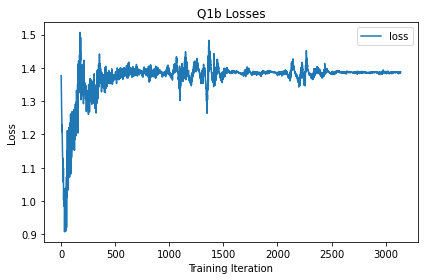

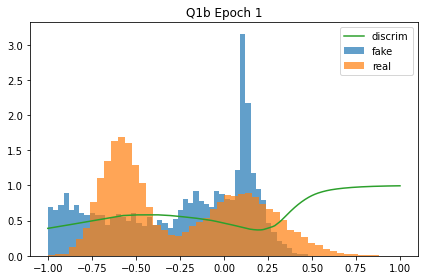

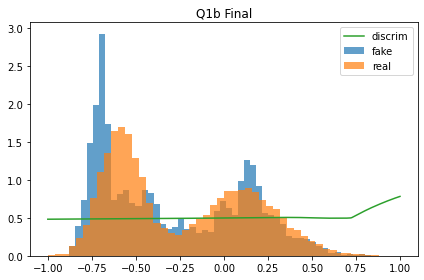

In [ ]:
q1_save_results('b', q1_b)

GPU available: True, used: False
TPU available: False, using: 0 TPU cores

  | Name          | Type          | Params
------------------------------------------------
0 | generator     | Generator     | 141   
1 | discriminator | Discriminator | 10 K  


Saving latest checkpoint..


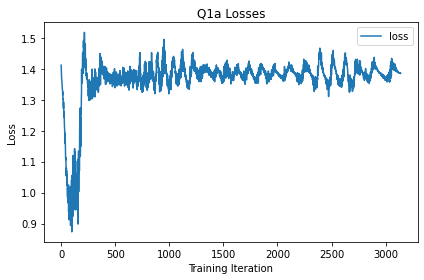

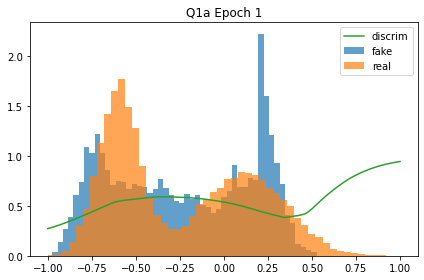

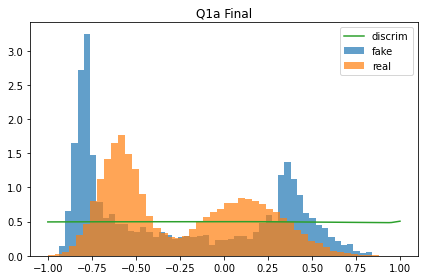

In [ ]:
q1_save_results('a', q1_b)

# Question 2: GANs on CIFAR-10 [35pt]

In this exercise, you will train GANs on CIFAR-10. Execute the cell below to visualize the dataset. 

Files already downloaded and verified


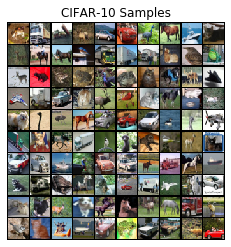

In [ ]:
visualize_q2_data()

 We'll use the CIFAR-10 architecture from the [SN-GAN paper](https://arxiv.org/pdf/1802.05957.pdf), with $z \in \mathbb R ^{128}$, with $z \sim \mathcal N (0, I_{128})$. Instead of upsampling via transposed convolutions and downsampling via pooling or striding, we'll use these DepthToSpace and SpaceToDepth methods for changing the spatial configuration of our hidden states. 

```
class DepthToSpace(nn.Module):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size
        self.block_size_sq = block_size * block_size

    def forward(self, input):
        output = input.permute(0, 2, 3, 1)
        (batch_size, d_height, d_width, d_depth) = output.size()
        s_depth = int(d_depth / self.block_size_sq)
        s_width = int(d_width * self.block_size)
        s_height = int(d_height * self.block_size)
        t_1 = output.reshape(batch_size, d_height, d_width, self.block_size_sq, s_depth)
        spl = t_1.split(self.block_size, 3)
        stack = [t_t.reshape(batch_size, d_height, s_width, s_depth) for t_t in spl]
        output = torch.stack(stack, 0).transpose(0, 1).permute(0, 2, 1, 3, 4).reshape(batch_size, s_height, s_width,
                                                                                      s_depth)
        output = output.permute(0, 3, 1, 2)
        return output


class SpaceToDepth(nn.Module):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size
        self.block_size_sq = block_size * block_size

    def forward(self, input):
        output = input.permute(0, 2, 3, 1)
        (batch_size, s_height, s_width, s_depth) = output.size()
        d_depth = s_depth * self.block_size_sq
        d_width = int(s_width / self.block_size)
        d_height = int(s_height / self.block_size)
        t_1 = output.split(self.block_size, 2)
        stack = [t_t.reshape(batch_size, d_height, d_depth) for t_t in t_1]
        output = torch.stack(stack, 1)
        output = output.permute(0, 2, 1, 3)
        output = output.permute(0, 3, 1, 2)
        return output

# Spatial Upsampling with Nearest Neighbors
Upsample_Conv2d(in_dim, out_dim, kernel_size=(3, 3), stride=1, padding=1):
    x = torch.cat([x, x, x, x], dim=1)
    DepthToSpace(block_size=2)
    Conv2d(in_dim, out_dim, kernel_size, stride=stride, padding=padding)


# Spatial Downsampling with Spatial Mean Pooling
Downsample_Conv2d(in_dim, out_dim, kernel_size=(3, 3), stride=1, padding=1):
        SpaceToDepth(2)
        torch.sum(x.chunk(4, dim=1)) / 4.0
        nn.Conv2d(in_dim, out_dim, kernel_size,
                              stride=stride, padding=padding, bias=bias)
```

Here's pseudocode for how we'll implement a ResBlockUp, used in the generator:

```
ResnetBlockUp(x, in_dim, kernel_size=(3, 3), n_filters=256):
    _x = x
    _x = nn.BatchNorm2d(in_dim)(_x)
    _x = nn.ReLU()(_x)
    _x = nn.Conv2d(in_dim, n_filters, kernel_size, padding=1)(_x)
    _x = nn.BatchNorm2d(n_filters)(_x)
    _x = nn.ReLU()(_x)
    residual = Upsample_Conv2d(n_filters, n_filters, kernel_size, padding=1)(_x)
    shortcut = Upsample_Conv2d(in_dim, n_filters, kernel_size=(1, 1), padding=0)(x)
    return residual + shortcut
```
The ResBlockDown module is similar, except it uses Downsample_Conv2d and omits the BatchNorm.

Finally, here's the architecture for the generator:
```
def Generator(*, n_samples=1024, n_filters=128):
    z = Normal(0, 1)([n_samples, 128])
    nn.Linear(128, 4*4*256)
    reshape output of linear layer
    ResnetBlockUp(in_dim=256, n_filters=n_filters),
    ResnetBlockUp(in_dim=n_filters, n_filters=n_filters),
    ResnetBlockUp(in_dim=n_filters, n_filters=n_filters),
    nn.BatchNorm2d(n_filters),
    nn.ReLU(),
    nn.Conv2d(n_filters, 3, kernel_size=(3, 3), padding=1),
    nn.Tanh()
```
Again, the discriminator has the same architecture, except with ResnetBlockDown and no BatchNorm.

**Hyperparameters**

We'll implement [WGAN-GP](https://arxiv.org/abs/1704.00028), which uses a gradient penalty to regularize the discriminator. Use the Adam optimizer with $\alpha = 2e-4$, $\beta_1 = 0$, $\beta_2 = 0.9$, $\lambda = 10$, $n_{critic} = 5$. Use a batch size of 256 and n_filters=128 within the ResBlocks. Train for at least 25000 gradient steps, with the learning rate linearly annealed to 0 over training. 

**You will provide the following deliverables**
1. Inception score (CIFAR-10 version) of the final model. We provide a utility that will automatically do this for you.
2. Fréchet inception distance (bonus, 5pts)
3. Discriminator loss across training
4. 100 samples. 

In [ ]:

class DepthToSpace(nn.Module):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size
        self.block_size_sq = block_size * block_size
 
    def forward(self, input):
        output = input.permute(0, 2, 3, 1) # b,c,h,w => b,h,w,c
        (batch_size, d_height, d_width, d_depth) = output.size()
        s_depth = int(d_depth / self.block_size_sq)
        s_width = int(d_width * self.block_size)
        s_height = int(d_height * self.block_size)
        t_1 = output.reshape(batch_size, d_height, d_width, self.block_size_sq, s_depth)
        spl = t_1.split(self.block_size, 3)
        stack = [t_t.reshape(batch_size, d_height, s_width, s_depth) for t_t in spl]
        output = torch.stack(stack, 0).transpose(0, 1).permute(0, 2, 1, 3, 4).reshape(batch_size, s_height, s_width,
                                                                                      s_depth)
        output = output.permute(0, 3, 1, 2)
        return output
 
 
class SpaceToDepth(nn.Module):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size
        self.block_size_sq = block_size * block_size
 
    def forward(self, input):
        output = input.permute(0, 2, 3, 1)
        (batch_size, s_height, s_width, s_depth) = output.size()
        d_depth = s_depth * self.block_size_sq
        d_width = int(s_width / self.block_size)
        d_height = int(s_height / self.block_size)
        t_1 = output.split(self.block_size, 2)
        stack = [t_t.reshape(batch_size, d_height, d_depth) for t_t in t_1]
        output = torch.stack(stack, 1)
        output = output.permute(0, 2, 1, 3)
        output = output.permute(0, 3, 1, 2)
        return output

class Upsample_Conv2d(nn.Module):
  def __init__(self, in_dim, out_dim, kernel_size=(3, 3), stride=1, padding=1):
    super().__init__()
    self.depth_to_space = DepthToSpace(block_size=2)
    self.conv_layer = nn.Conv2d(in_dim, out_dim, kernel_size, stride, padding)

  def forward(self, x):
    x = torch.cat([x, x, x, x], dim=1)
    d2s = self.depth_to_space(x)
    return self.conv_layer(d2s)


class Downsample_Conv2d(nn.Module):
  def __init__(self, in_dim, out_dim, kernel_size=(3, 3), stride=1, padding=1):
    super().__init__()
    self.space_to_depth = SpaceToDepth(block_size=2)
    self.conv_layer = nn.Conv2d(in_dim, out_dim, kernel_size, stride, padding)

  def forward(self, x):
    s2d = self.space_to_depth(x)
    s2d_chunk = s2d.chunk(4, dim=1)
    s2d = (s2d_chunk[0] + s2d_chunk[1] + s2d_chunk[2] +s2d_chunk[3])/4.0
    return self.conv_layer(s2d)

class ResnetBlockUp(nn.Module):
  def __init__(self, in_dim, kernel_size=(3,3), n_filters=256):
    super().__init__()
    self.block = nn.Sequential(
            nn.BatchNorm2d(in_dim),
            nn.ReLU(),
            nn.Conv2d(in_dim, n_filters, kernel_size, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU()
    )
    
    self.residual = Upsample_Conv2d(n_filters, n_filters, kernel_size, padding=1)      
    self.shortcut = Upsample_Conv2d(in_dim, n_filters, kernel_size = 1, padding=0)

  def forward(self, x):
    _x = self.block(x)
    _x = self.residual(_x)
    s_out = self.shortcut(x)
    return _x + s_out



class ResnetBlockDown(nn.Module):
  def __init__(self, in_dim, kernel_size=(3,3), n_filters=256):
    super().__init__()
    self.block = nn.Sequential(
            nn.Conv2d(in_dim, n_filters, kernel_size, padding=1),
            nn.ReLU()
    )
    
    self.residual = Downsample_Conv2d(n_filters, n_filters, kernel_size, padding=1)      
    self.shortcut = Downsample_Conv2d(in_dim, n_filters, kernel_size = 1, padding=0)

  def forward(self, x):
    _x = self.block(x)
    _x = self.residual(_x)
    s_out = self.shortcut(x)
    return _x + s_out



class Generator(nn.Module):
  def __init__(self, latent_dim = 128):
    super().__init__()

    self.latent_dim = 128
    self.linear = nn.Linear(latent_dim, 4*4*256)

    self.upsample = nn.Sequential(
        ResnetBlockUp(256, n_filters = 128),
        ResnetBlockUp(128, n_filters = 128),
        ResnetBlockUp(128, n_filters = 128),
        nn.ReLU(),
        nn.Conv2d(128, 3, 3, padding = 1),
        nn.Tanh()
    )

  def forward(self, x):
    batch_size = x.shape[0]
    linear_out = self.linear(x)
    
    return self.upsample(linear_out.view(batch_size, 256, 4, 4))


class Discriminator(nn.Module):
  def __init__(self, n_filters=256):
    super().__init__()

    self.downsample = nn.Sequential(
        nn.Conv2d(3, 128, 3, padding=1),
        nn.ReLU(),
        ResnetBlockDown(128, n_filters=n_filters),
        ResnetBlockDown(n_filters, n_filters=n_filters),
        ResnetBlockDown(n_filters, n_filters=n_filters),
        nn.ReLU()
    )
    self.linear = nn.Linear(n_filters, 1)
    

  def forward(self, x):
    downsample_out = self.downsample(x)
    return self.linear(torch.sum(downsample_out, dim=[2,3]))


In [ ]:
class Trainer_WGAN_GP():
  def __init__(self, generator, discriminator, latent_dim = 128,
               n_critic = 5,  lambda_ = 10, epochs = 20, use_cuda = False):
    self.n_critic = 5
    # GP-multiplier
    self.lambda_ = lambda_

    self.generator = generator
    self.discriminator = discriminator

    self.epochs = epochs
    self.latent_dim = latent_dim

    if use_cuda:
      assert torch.cuda.is_available()
      self.generator.cuda()
      self.discriminator.cuda()

    self.use_cuda = use_cuda


    # Config optimizers
    self.d_opt = torch.optim.Adam(self.discriminator.parameters(), lr = 2e-4, betas = (0, 0.9)) # Discriminator
    self.g_opt = torch.optim.Adam(self.generator.parameters(), lr = 2e-4, betas = (0, 0.9)) # Generator

    self.losses = {}
    self.losses['d_loss'] = []
    # self.losses['g_loss'] = []
    # self.losses['gp'] = []

  def gradient_penalty(self, data, samples):
    epsilon = torch.rand(data.shape[0], 1, 1, 1)
    if self.use_cuda:
      epsilon = epsilon.cuda()
    interpolation = epsilon*data + (1 - epsilon)*samples

    interpolation = Variable(interpolation, requires_grad = True)

    d_interpolation = self.discriminator(interpolation)

    gp = torch.autograd.grad(d_interpolation, interpolation, 
                             grad_outputs= torch.ones(d_interpolation.size()).cuda() if self.use_cuda else torch.ones(
                               d_interpolation.size()),
                             retain_graph=True, create_graph=True)[0]

    gp = gp.view(data.shape[0], -1)
    gradients_norm = torch.sqrt(torch.sum(gp ** 2, dim=1) + 1e-12)
    

    return self.lambda_*((gradients_norm - 1)**2).mean()




  def train_critic(self, data):
    latents = torch.randn(data.shape[0], self.latent_dim)
    

    if self.use_cuda:
      data = data.cuda()
      latents = latents.cuda()

    

    samples = self.generator(latents)
    d_samples = self.discriminator(samples)

    d_data = self.discriminator(data)

    self.d_opt.zero_grad()
    gp = self.gradient_penalty(data, samples)
    loss = d_samples.mean() - d_data.mean() + gp

    d_loss = loss.item()
    self.losses['d_loss'].append(d_loss)

    loss.backward()
    self.d_opt.step()

    return d_loss


  def train_generator(self, data):
    
    latents = torch.randn(data.shape[0], self.latent_dim)

    if self.use_cuda:
      data = data.cuda()
      latents = latents.cuda()

    samples = self.generator(latents)
    d_samples = self.discriminator(samples)

    self.g_opt.zero_grad()
    loss = -1*(d_samples.mean())
    g_loss = loss.item()
    loss.backward()
    self.g_opt.step()

    return g_loss



  def train_epoch(self, data_loader):
    d_loss_epoch = 0.0
    for i, data in enumerate(tqdm_notebook(data_loader, desc='Batch', leave=False)):
      data = data.float()
      data = 2.0*data - 1.0
      
      d_loss = self.train_critic(data)

      if (i+1)%self.n_critic == 0:
        
        self.train_generator(data)      

      d_loss_epoch += d_loss

      # if i%100 == 0:
      #   print("\nDiscriminator Loss for batch {}: {}".format(i+1, d_loss))
    
    return d_loss_epoch/len(data_loader)
    

  def train(self, data_loader):
    for epoch in tqdm_notebook(range(0, self.epochs), desc='Epoch', leave=False):
      self.generator.train()
      self.discriminator.train()
      d_loss_epoch = self.train_epoch(data_loader)
      print("\nEpoch {}: Loss: {}".format(epoch + 1, d_loss_epoch))
      samples = self.sample(100)
      show_samples(samples[:100] * 255.0)
      self.save_model('q2.pt')


  def sample(self, sample_size):
    latents = torch.randn(sample_size, self.latent_dim)
    self.discriminator.eval()
    self.generator.eval()
    if self.use_cuda:
      latents = latents.cuda()
    with torch.no_grad():
      samples = self.generator(latents)
      samples = (samples + 1)/2.0
      return samples.permute(0,2,3,1).cpu().detach().numpy() 


  def save_model(self, filename):
    torch.save(self.generator.state_dict(), "g_" + filename)
    torch.save(self.discriminator.state_dict(), "d_" + filename)

  def load_model(self, filename):
      d_path = "d_" + filename
      g_path = "g_" + filename
      self.discriminator.load_state_dict(torch.load(d_path))
      self.generator.load_state_dict(torch.load(g_path))



## Solution

In [ ]:
train_data = load_q2_data()
train_data = train_data.data.transpose((0, 3, 1, 2)) / 255.0


In [ ]:
train_data_loader = data.DataLoader(train_data, batch_size = 256, shuffle=True)

In [ ]:
def q2(train_data):
    """
    train_data: An (n_train, 3, 32, 32) numpy array of CIFAR-10 images with values in [0, 1]

    Returns
    - a (# of training iterations,) numpy array of WGAN critic train losses evaluated every minibatch
    - a (1000, 32, 32, 3) numpy array of samples from your model in [0, 1]. 
        The first 100 will be displayed, and the rest will be used to calculate the Inception score. 
    """

    """ YOUR CODE HERE """
    train_data_loader = data.DataLoader(train_data, batch_size = 256, shuffle=True)
    gen = Generator()
    disc = Discriminator()

    wgan_gp_trainer = Trainer_WGAN_GP(gen, disc, use_cuda = True, epochs=20)

    wgan_gp_trainer.train(train_data_loader)

    samples = wgan_gp_trainer.sample(1000)
    
    return np.array(wgan_gp_trainer.losses['d_loss']), samples


    

## Results

Files already downloaded and verified



Epoch 1: Loss: -9.51685887088581


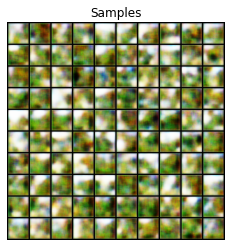

KeyboardInterrupt: ignored

In [ ]:
q2_save_results(q2)

# Question 3: Representation Learning with BiGAN on MNIST [45pt]

In this part, we train a BiGAN on the MNIST dataset. Execute the cell below to visualize the dataset.

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw
Processing...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Done!


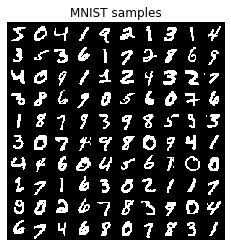

In [ ]:
visualize_q3_data()

In BiGAN, in addition to training a generator $G$ and a discriminator $D$, we train an encoder $E$ that maps from real images $x$ to latent codes $z$. The discriminator now must learn to jointly identify fake $z$, fake $x$, and paired $(x, z)$ that don't belong together. In the original [BiGAN paper](https://arxiv.org/pdf/1605.09782.pdf), they prove that the optimal $E$ learns to invert the generative mapping $G: z \rightarrow x$. Our overall minimax term is now
$$V(D, E, G) = \mathbb{E}_{x \sim p_x}[\mathbb{E}_{z \sim p_E(\cdot | x)}[\log D(x, z)]] + \mathbb{E}_{z \sim p_z}[\mathbb{E}_{x \sim p_G(\cdot | z)}[\log (1 - D(x, z))]]$$

**Architecture**

We will closely follow the MNIST architecture outlined in the original BiGAN paper, Appendix C.1, with one modification: instead of having $z \sim \text{Uniform}[-1, 1]$, we use $z \sim \mathcal N (0, 1)$ with $z \in \mathbb R ^{50}$. 

**Hyperparameters**

We make several modifications to what is listed in the BiGAN paper. We apply $l_2$ weight decay to all weights and decay the step size $\alpha$ linearly to 0 over the course of training. Weights are initialized via the default PyTorch manner. We recommend training for at least 100 epochs -- this part is much less computationally expensive than previous homeworks. 

**Reconstructions**

You should take the first 20 images from the MNIST training set and then display the reconstructions $x_{recon} = G(E(x))$. It's ok if your reconstructions are somewhat lossy; ours are too. We will provide a utility to show these. 

**Testing the representation**

We want to see how good a linear classifier $L$ we can learn such that 
$$y \approx L(E(x))$$
where $y$ is the appropriate label. Fix $E$ and learn a weight matrix $W$ such that your linear classifier is composed of passing $x$ through $E$, then multiplying by $W$, then applying a softmax nonlinearity. Train this via gradient descent with the cross-entropy loss. 

As a baseline, randomly initialize another network $E_{random}$ with the same architecture, fix its weights, and train a linear classifier on top, as done in the previous part.


**You will provide the following deliverables**
1. Plot of the minimax loss term. 
2. 100 samples from the BiGAN
3. A comparison of MNIST images $x$ with their reconstructions $G(E(x))$.
4. Test loss plot for the linear classifier trained on the pretrained encoder, and a randomly initialized encoder. 
5. Final test losses for the two linear classifiers. 

**Feel free to train the networks separately, save the necessary information, and simply use our function to generate the appropriate figures.**


## Solution

In [ ]:
def q3(train_data, test_data):
    """
    train_data: A PyTorch dataset that contains (n_train, 28, 28) MNIST digits, normalized to [-1, 1]
                Documentation can be found at torchvision.datasets.MNIST
    test_data: A PyTorch dataset that contains (n_test, 28, 28) MNIST digits, normalized to [-1, 1]
                Documentation can be found at torchvision.datasets.MNIST

    Returns
    - a (# of training iterations,) numpy array of BiGAN minimax losses evaluated every minibatch
    - a (100, 28, 28, 1) numpy array of BiGAN samples that lie in [0, 1]
    - a (40, 28, 28, 1) numpy array of 20 real image / reconstruction pairs
    - a (# of training epochs,) numpy array of supervised cross-entropy losses on the BiGAN encoder evaluated every epoch 
    - a (# of training epochs,) numpy array of supervised cross-entropy losses on a random encoder evaluated every epoch 
    """

    """ YOUR CODE HERE """

## Results

In [ ]:
q3_save_results(q3)

# Question 4 (Bonus): CycleGAN [20pt]
In this question, you'll train a CycleGAN model to learn to translate between two different image domains, without any paired data. Execute the following cell to visualize our two datasets: MNIST and Colored MNIST. 

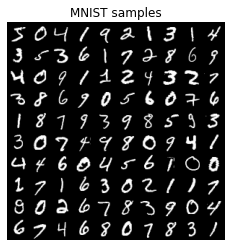

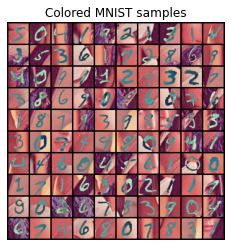

In [ ]:
visualize_cyclegan_datasets()

In [CycleGAN](https://arxiv.org/pdf/1703.10593.pdf), the goal is to learn functions $F$ and $G$ that can transform images from $X \rightarrow Y$ and vice-versa. This is an unconstrained problem, so we additionally enforce the *cycle-consistency* property, where we want 
$$x \approx G(F(x))$$
and  
$$y \approx F(G(x))$$
This loss function encourages $F$ and $G$ to approximately invert each other. In addition to this cycle-consistency loss, we also have a standard GAN loss such that $F(x)$ and $G(y)$ look like real images from the other domain. 

Since this is a bonus question, we won't do much hand-holding. We recommend reading through the original paper to get a sense of what architectures and hyperparameters are useful. Note that our datasets are fairly simple, so you won't need excessively large models. 

**You will report the following deliverables**
1. A set of images showing real MNIST digits, transformations of those images into Colored MNIST digits, and reconstructions back into the greyscale domain. 
2. A set of images showing real Colored MNIST digits, transformations of those images, and reconstructions. 

In [ ]:
class Resblock(nn.Module):
  def __init__(self, in_channels, kernel_size=3):
    super().__init__()
    self.resblock = nn.Sequential(
          nn.Conv2d(in_channels, in_channels, kernel_size, padding = kernel_size//2),
          nn.BatchNorm2d(in_channels),
          nn.LeakyReLU(0.1),
          nn.Conv2d(in_channels, in_channels, kernel_size, padding = kernel_size//2),
          nn.BatchNorm2d(in_channels),
          nn.LeakyReLU(0.1)
    )

  def forward(self, x):
    return x + self.resblock(x)


class Generator(nn.Module):
  def __init__(self, in_channels, out_channels):
    super().__init__()
    # input => [-1, 1]
    self.net = nn.Sequential(
        nn.Conv2d(in_channels, 64, 3, 2, 1), # 14 x 14
        nn.Conv2d(64, 64, 3, 2, 1), # 7 x 7
        Resblock(64),
        Resblock(64),
        nn.LeakyReLU(0.1),
        nn.ConvTranspose2d(64, 64, 4, 2, 1), # 14 x 14
        nn.LeakyReLU(0.1),
        nn.ConvTranspose2d(64, out_channels, 4, 2, 1), # 28 x 28
        nn.Tanh()
    )

  def forward(self, x):
    return self.net(x)

class Discriminator(nn.Module):
  def __init__(self, in_channels):
    super().__init__()
    self.net = nn.Sequential(
        nn.Conv2d(in_channels, 64, 3, 2, 1), # 14 x 14
        nn.Conv2d(64, 64, 3, 2, 1), # 7 x 7
        Resblock(64),
        Resblock(64),
        nn.LeakyReLU(0.1),
        nn.Conv2d(64, 128, 3, 2, 1), # 4 x 4
        nn.LeakyReLU(0.1),
        nn.Flatten(),
        nn.Linear(128*4*4, 1),
        nn.Sigmoid()
    )

  def forward(self, x):
    return self.net(x)


class CycleGAN_Trainer():
  def __init__(self, lambda_ = 10, epochs = 20, n_critic = 5, use_cuda=False):
    """
      X => binary MNIST
      Y => Color MNIST
    """
    self.G = Generator(in_channels = 1, out_channels = 3) # G(x) => y
    self.F = Generator(in_channels = 3, out_channels = 1) # F(y) => x

    self.D_y = Discriminator(in_channels = 3) # D_y(y) E Y?
    self.D_x = Discriminator(in_channels = 1) # D_x(x) E X

    self.lambda_ = lambda_
    self.epochs = epochs
    self.n_critic = n_critic

    if use_cuda:
      assert torch.cuda.is_available()
      self.G.cuda()
      self.F.cuda()
      self.D_y.cuda()
      self.D_x.cuda()

    self.use_cuda = use_cuda

    # Config optimizers
    Disc_params = list(self.D_x.parameters()) + list(self.D_y.parameters())
    Gen_params = list(self.G.parameters()) + list(self.F.parameters())

    self.d_opt = torch.optim.Adam(Disc_params, lr = 2e-4) # Discriminator
    self.g_opt = torch.optim.Adam(Gen_params, lr = 2e-4) # Generator
      

  def critic_loss(self, batch_x, batch_y):
    # import pdb;pdb.set_trace()
    G_out = self.G(batch_x)
    F_out = self.F(batch_y)

    D_x_samples = self.D_x(F_out)
    D_y_samples = self.D_y(G_out)

    D_x_out = self.D_x(batch_x)
    D_y_out = self.D_y(batch_y)

    loss = ((D_x_out - 1)**2).mean() + ((D_x_samples)**2).mean() + ((D_y_out - 1)**2).mean() + ((D_y_samples)**2).mean()

    self.d_opt.zero_grad()
    loss.backward()
    self.d_opt.step()

    return loss.item()

  def generator_loss(self, batch_x, batch_y):
    G_out = self.G(batch_x)
    F_out = self.F(batch_y)

    F_G_out = self.F(G_out)
    G_F_out = self.G(F_out)

    D_x_samples = self.D_x(F_out)
    D_y_samples = self.D_y(G_out)

    gan_loss = ((D_x_samples - 1)**2).mean() + ((D_y_samples - 1)**2).mean()

    cycle_loss = (torch.mean(torch.abs(batch_x - F_G_out), dim=[1, 2, 3])).mean() + (torch.mean(torch.abs(batch_y - G_F_out), dim=[1, 2, 3])).mean()

    loss = gan_loss + self.lambda_*cycle_loss

    self.g_opt.zero_grad()
    loss.backward()
    self.g_opt.step()

    return loss.item()


  def train_one_epoch(self, data_loader):

    d_loss_epoch = 0.0
    g_loss_epoch = 0.0
    g_counter = 0

    for i, data in enumerate(tqdm_notebook(data_loader, desc='Batch', leave=False)):
      batch_x, batch_y = data

      if self.use_cuda:
        batch_x = batch_x.cuda()
        batch_y = batch_y.cuda()

      batch_x = 2.0*batch_x.float() - 1.0
      batch_y = 2.0*batch_y.float() - 1.0


      self.D_x.train()
      self.D_y.train()

      d_loss = self.critic_loss(batch_x, batch_y)

      if (i+1)%self.n_critic == 0:
        self.G.train()
        self.F.train()

        g_loss = self.generator_loss(batch_x, batch_y)
        g_counter += 1
        g_loss_epoch += g_loss

      d_loss_epoch += d_loss
      

    return d_loss_epoch/len(data_loader), g_loss_epoch/g_counter

  
  def train(self, mnist_data, cminst_data, data_loader):

    for epoch in tqdm_notebook(range(0, self.epochs), desc='Epoch', leave=False):

      d_loss_epoch, g_loss_epoch = self.train_one_epoch(data_loader)

      print("\nEpoch {} - D_Loss: {}, G_Loss: {}".format(epoch + 1, d_loss_epoch, g_loss_epoch))

      idx = np.random.randint(low=0, high = len(mnist_data), size=10)

      mnist_samples = mnist_data[idx]
      cmnist_samples = cminst_data[idx]
      
      
      t1, r1 = self.translate_and_reconstruct(mnist_samples, self.G, self.F)
      t2, r2 = self.translate_and_reconstruct(cmnist_samples, self.F, self.G)

      mnist_samples = mnist_samples.transpose(0, 2, 3, 1)
      cmnist_samples = cmnist_samples.transpose(0, 2, 3, 1)

      print("MNIST => CMINST: ")
      show_samples(mnist_samples*255.0)
      show_samples(t1*255.0)
      show_samples(r1*255.0)

      print("CMNIST => MINST: ")
      show_samples(cmnist_samples*255.0)
      show_samples(t2*255.0)
      show_samples(r2*255.0)



  def translate_and_reconstruct(self, real, G, F):
    real = torch.Tensor(real).float().cuda()
    real = 2*real - 1

    G.eval()
    F.eval()

    with torch.no_grad():
      translation = G(real)
      reconstruction = F(translation)

      translation = (translation + 1)/2.0
      reconstruction = (reconstruction + 1)/2.0

      return translation.permute(0,2,3,1).cpu().detach().numpy(), reconstruction.permute(0,2,3,1).cpu().detach().numpy()


class Color_MNIST(data.Dataset):
  def __init__(self, x1, x2):
    self.x1 = x1
    self.x2 = x2

  def __len__(self):
    return len(self.x1)

  def __getitem__(self, index):
    return self.x1[index], self.x2[index]
 



In [ ]:
mnist_data, cminst_data = load_q4_data()
np.random.shuffle(mnist_data)
np.random.shuffle(cminst_data)
train_data = Color_MNIST(mnist_data, cminst_data)

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw
Processing...
Done!




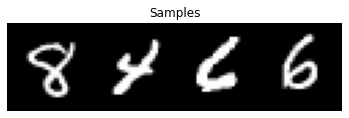

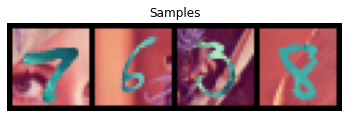

In [ ]:
show_samples(mnist_data[0:4].transpose(0,2,3,1)*255.0)
show_samples(cminst_data[0:4].transpose(0,2,3,1)*255.0)

In [ ]:
train_data_loader = data.DataLoader(train_data, batch_size = 128, shuffle=True)

In [ ]:
cycle_gan_trainer = CycleGAN_Trainer(epochs=100, n_critic = 1, use_cuda = True, lambda_ = 5)


Epoch 1 - D_Loss: 0.4385203766117274, G_Loss: 3.812826258287247
MNIST => CMINST: 


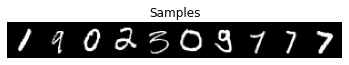

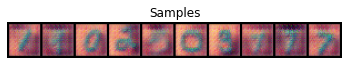

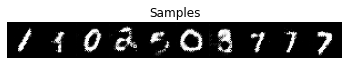

CMNIST => MINST: 


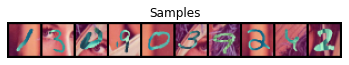

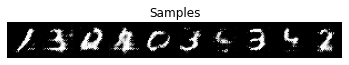

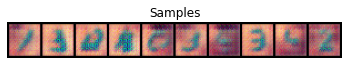


Epoch 2 - D_Loss: 0.8501106357571285, G_Loss: 3.2427712793289216
MNIST => CMINST: 


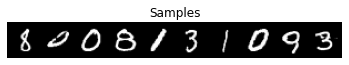

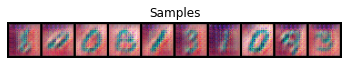

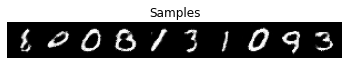

CMNIST => MINST: 


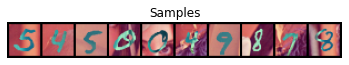

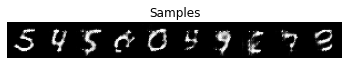

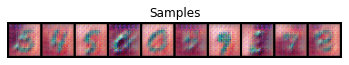


Epoch 3 - D_Loss: 0.7050154749582063, G_Loss: 2.9223330920693207
MNIST => CMINST: 


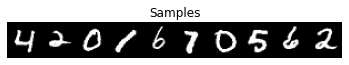

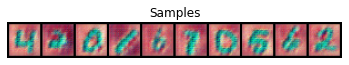

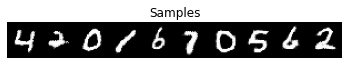

CMNIST => MINST: 


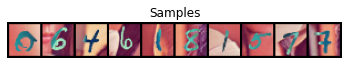

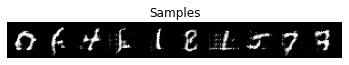

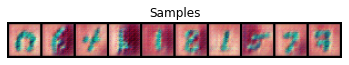


Epoch 4 - D_Loss: 1.0215705422196053, G_Loss: 3.206314389893749
MNIST => CMINST: 


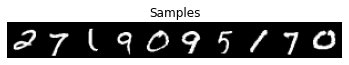

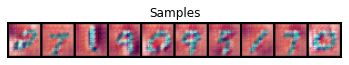

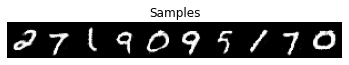

CMNIST => MINST: 


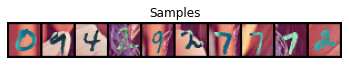

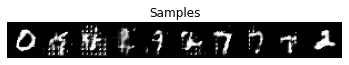

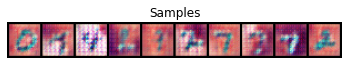


Epoch 5 - D_Loss: 1.1508839770929138, G_Loss: 3.1918002333976565
MNIST => CMINST: 


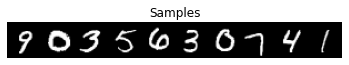

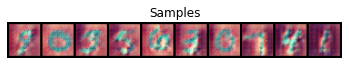

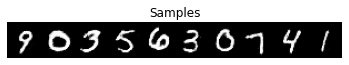

CMNIST => MINST: 


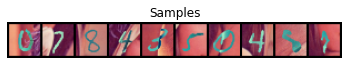

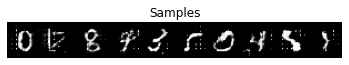

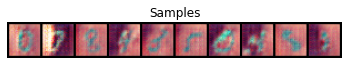


Epoch 6 - D_Loss: 1.2267791414057523, G_Loss: 3.0715290503715402
MNIST => CMINST: 


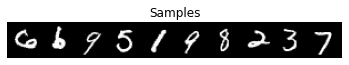

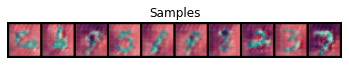

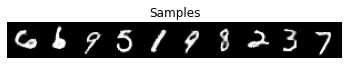

CMNIST => MINST: 


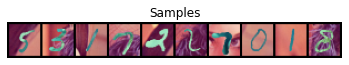

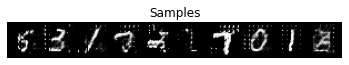

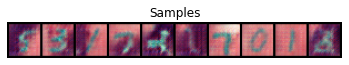


Epoch 7 - D_Loss: 1.2021137023531299, G_Loss: 2.9632653244522844
MNIST => CMINST: 


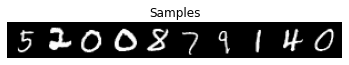

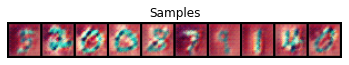

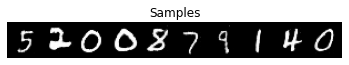

CMNIST => MINST: 


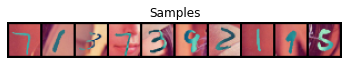

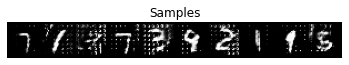

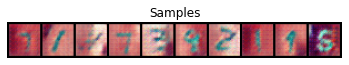


Epoch 8 - D_Loss: 1.134991894398671, G_Loss: 2.8798393120389503
MNIST => CMINST: 


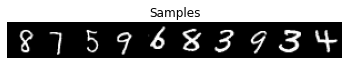

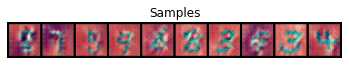

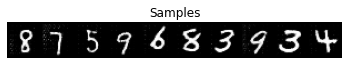

CMNIST => MINST: 


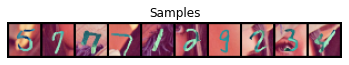

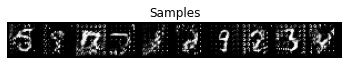

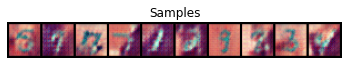


Epoch 9 - D_Loss: 1.1108522618503205, G_Loss: 2.8170870392561467
MNIST => CMINST: 


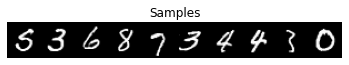

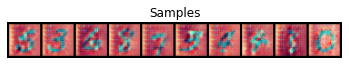

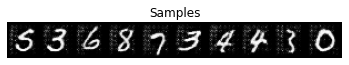

CMNIST => MINST: 


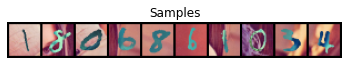

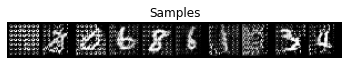

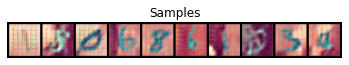


Epoch 10 - D_Loss: 1.2389435546992937, G_Loss: 2.7241766945893833
MNIST => CMINST: 


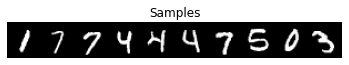

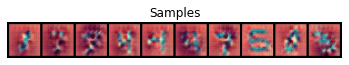

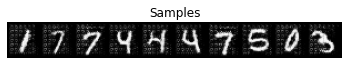

CMNIST => MINST: 


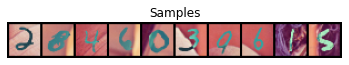

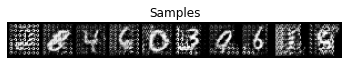

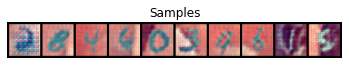


Epoch 11 - D_Loss: 1.1820550231791254, G_Loss: 2.672161179056554
MNIST => CMINST: 


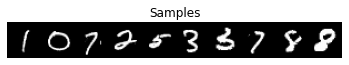

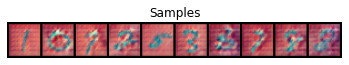

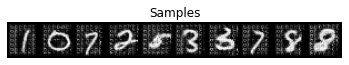

CMNIST => MINST: 


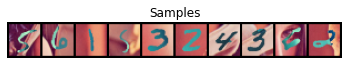

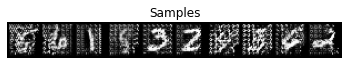

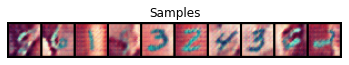


Epoch 12 - D_Loss: 1.140685685153709, G_Loss: 2.648987051012165
MNIST => CMINST: 


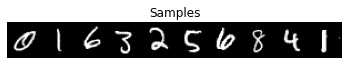

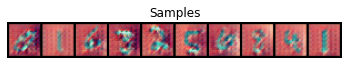

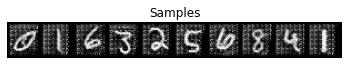

CMNIST => MINST: 


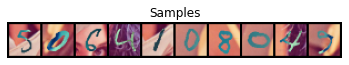

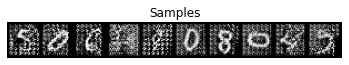

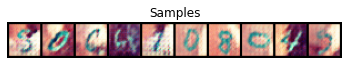


Epoch 13 - D_Loss: 1.1253702238932857, G_Loss: 2.623811446781606
MNIST => CMINST: 


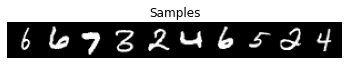

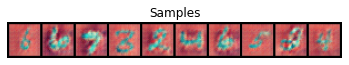

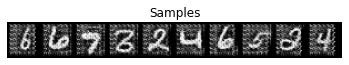

CMNIST => MINST: 


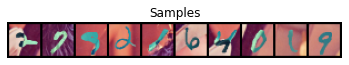

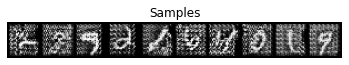

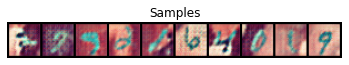


Epoch 14 - D_Loss: 1.1086510633354756, G_Loss: 2.6119286607323424
MNIST => CMINST: 


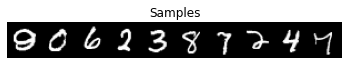

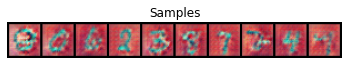

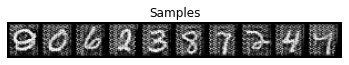

CMNIST => MINST: 


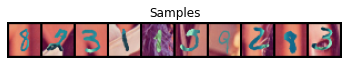

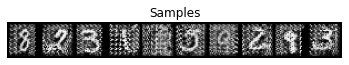

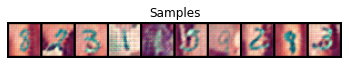


Epoch 15 - D_Loss: 1.0901804849791374, G_Loss: 2.596419918003367
MNIST => CMINST: 


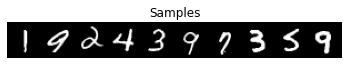

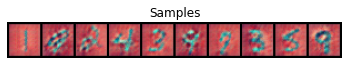

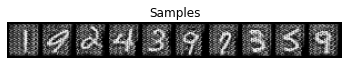

CMNIST => MINST: 


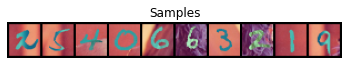

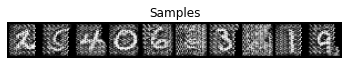

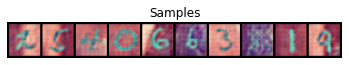


Epoch 16 - D_Loss: 1.1274168638786528, G_Loss: 2.579070913766239
MNIST => CMINST: 


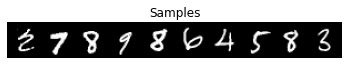

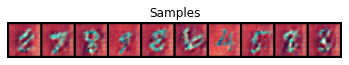

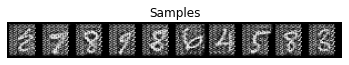

CMNIST => MINST: 


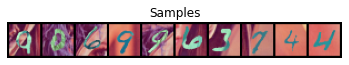

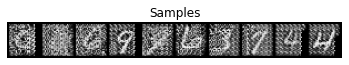

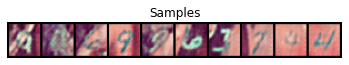


Epoch 17 - D_Loss: 1.1488706930868153, G_Loss: 2.5562690593032187
MNIST => CMINST: 


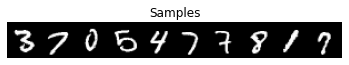

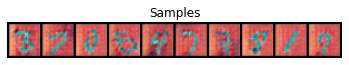

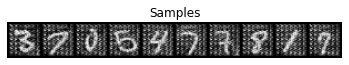

CMNIST => MINST: 


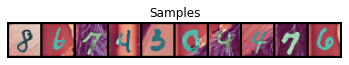

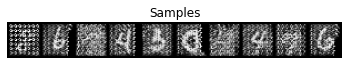

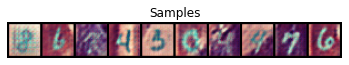


Epoch 18 - D_Loss: 1.1301320829371144, G_Loss: 2.525078992091262
MNIST => CMINST: 


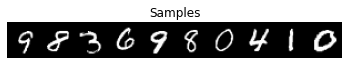

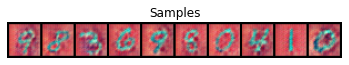

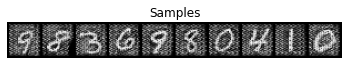

CMNIST => MINST: 


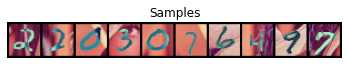

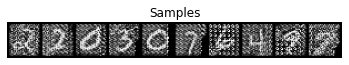

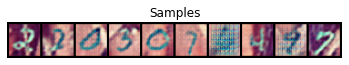


Epoch 19 - D_Loss: 0.7730496882725117, G_Loss: 2.7931773286384307
MNIST => CMINST: 


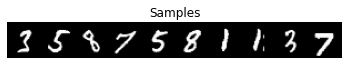

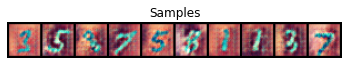

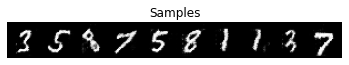

CMNIST => MINST: 


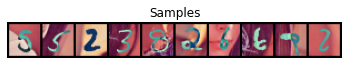

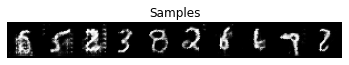

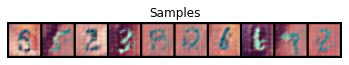


Epoch 20 - D_Loss: 0.6902922044939069, G_Loss: 2.676972988063593
MNIST => CMINST: 


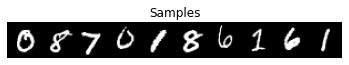

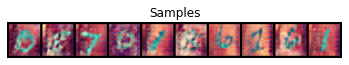

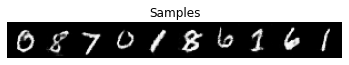

CMNIST => MINST: 


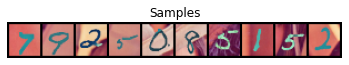

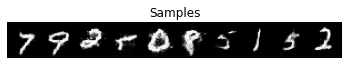

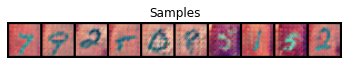


Epoch 21 - D_Loss: 0.6400312760364272, G_Loss: 2.644041516887608
MNIST => CMINST: 


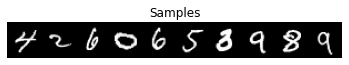

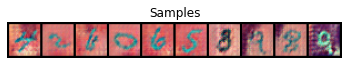

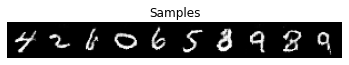

CMNIST => MINST: 


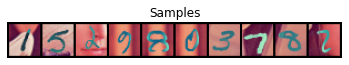

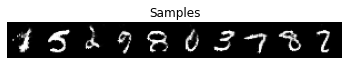

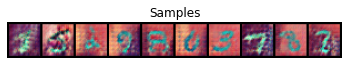


Epoch 22 - D_Loss: 0.602373840712281, G_Loss: 2.664141205582283
MNIST => CMINST: 


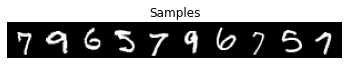

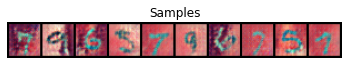

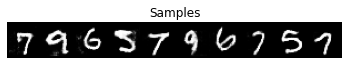

CMNIST => MINST: 


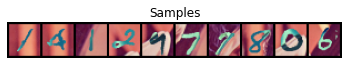

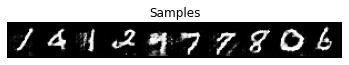

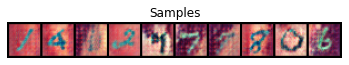


Epoch 23 - D_Loss: 0.5795309955059592, G_Loss: 2.68828858088837
MNIST => CMINST: 


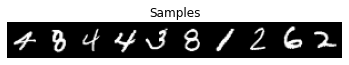

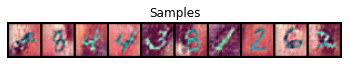

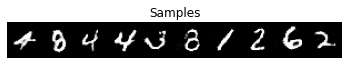

CMNIST => MINST: 


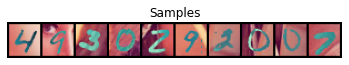

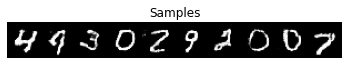

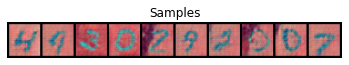


Epoch 24 - D_Loss: 0.43688377450460564, G_Loss: 2.7843864935039204
MNIST => CMINST: 


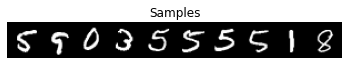

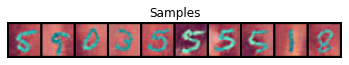

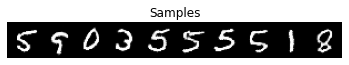

CMNIST => MINST: 


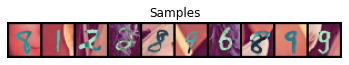

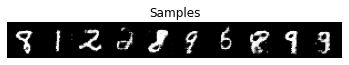

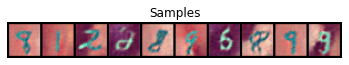


Epoch 25 - D_Loss: 0.4745946976421738, G_Loss: 2.687093134882099
MNIST => CMINST: 


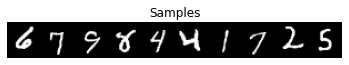

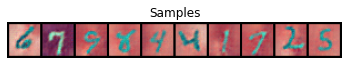

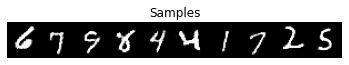

CMNIST => MINST: 


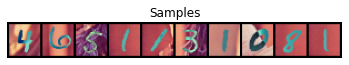

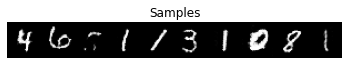

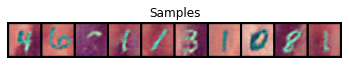


Epoch 26 - D_Loss: 0.4645299358503905, G_Loss: 2.574958192260026
MNIST => CMINST: 


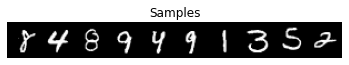

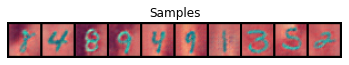

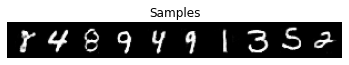

CMNIST => MINST: 


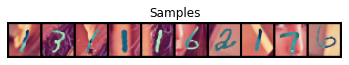

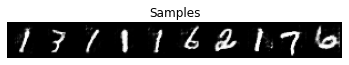

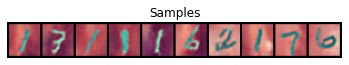


Epoch 27 - D_Loss: 0.763847809705907, G_Loss: 2.8094540821718
MNIST => CMINST: 


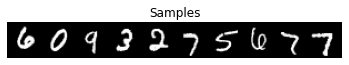

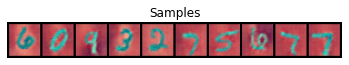

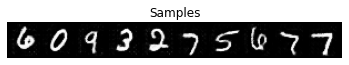

CMNIST => MINST: 


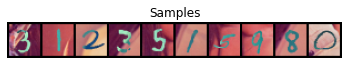

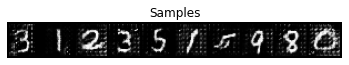

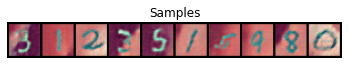


Epoch 28 - D_Loss: 0.9999710091395673, G_Loss: 2.721494603004537
MNIST => CMINST: 


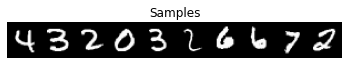

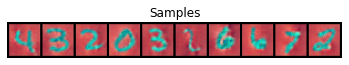

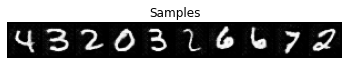

CMNIST => MINST: 


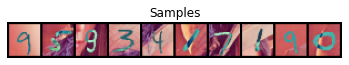

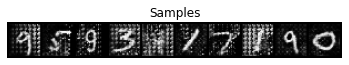

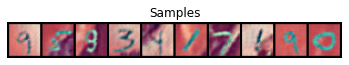


Epoch 29 - D_Loss: 0.9999440115397927, G_Loss: 2.617218663189203
MNIST => CMINST: 


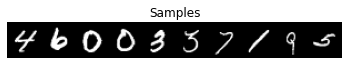

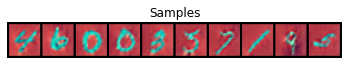

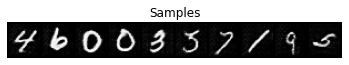

CMNIST => MINST: 


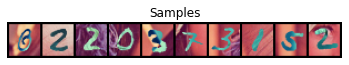

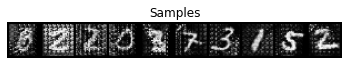

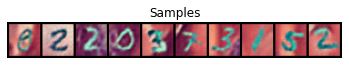


Epoch 30 - D_Loss: 0.8090550967006644, G_Loss: 2.4963805934767733
MNIST => CMINST: 


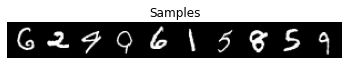

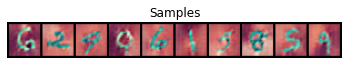

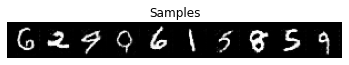

CMNIST => MINST: 


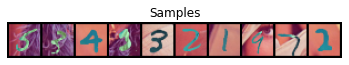

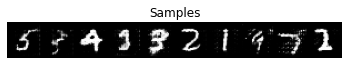

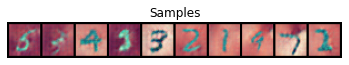


Epoch 31 - D_Loss: 0.4438385981867817, G_Loss: 2.4381369380300235
MNIST => CMINST: 


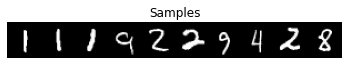

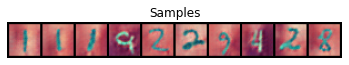

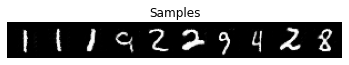

CMNIST => MINST: 


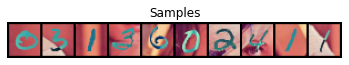

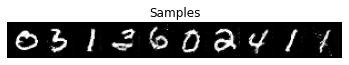

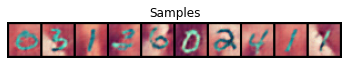


Epoch 32 - D_Loss: 0.4464132375459173, G_Loss: 2.377890194402829
MNIST => CMINST: 


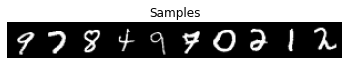

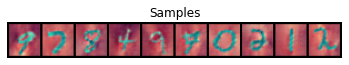

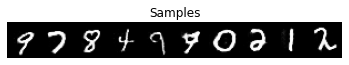

CMNIST => MINST: 


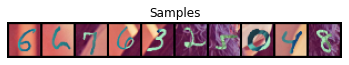

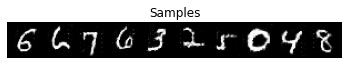

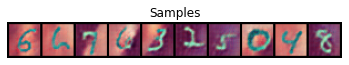


Epoch 33 - D_Loss: 0.4720999322402706, G_Loss: 2.2851472510966158
MNIST => CMINST: 


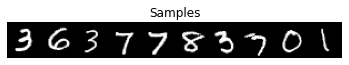

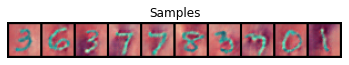

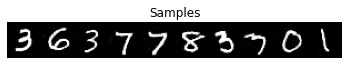

CMNIST => MINST: 


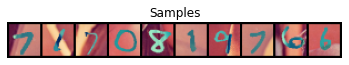

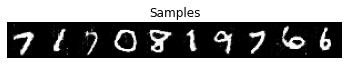

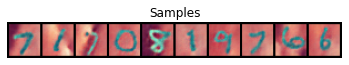


Epoch 34 - D_Loss: 0.458256668246377, G_Loss: 2.2622117213348845
MNIST => CMINST: 


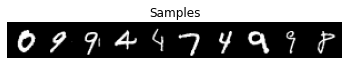

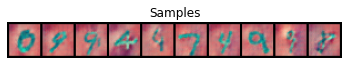

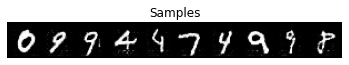

CMNIST => MINST: 


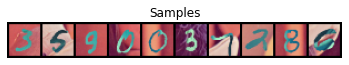

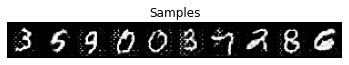

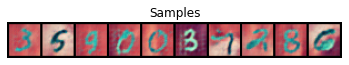


Epoch 35 - D_Loss: 0.46796348887974265, G_Loss: 2.250791542565645
MNIST => CMINST: 


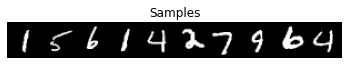

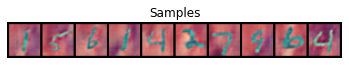

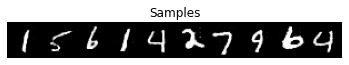

CMNIST => MINST: 


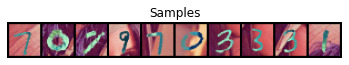

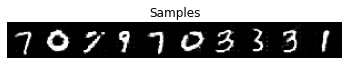

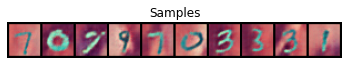


Epoch 36 - D_Loss: 0.49341090820999794, G_Loss: 2.222235401810359
MNIST => CMINST: 


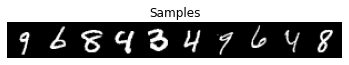

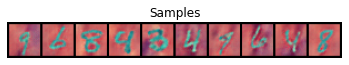

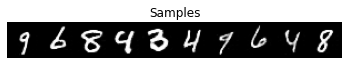

CMNIST => MINST: 


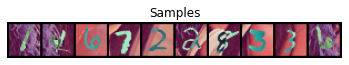

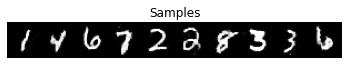

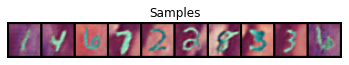


Epoch 37 - D_Loss: 0.44906254230277626, G_Loss: 2.114041358168954
MNIST => CMINST: 


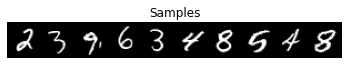

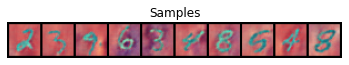

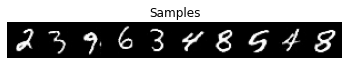

CMNIST => MINST: 


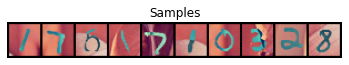

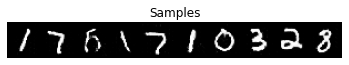

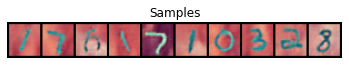


Epoch 38 - D_Loss: 0.4639181790194278, G_Loss: 2.13479736847664
MNIST => CMINST: 


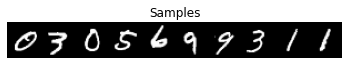

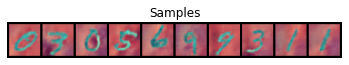

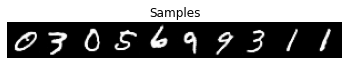

CMNIST => MINST: 


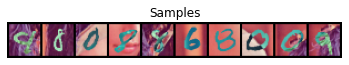

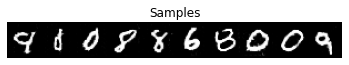

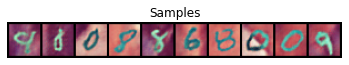


Epoch 39 - D_Loss: 0.46589245864831563, G_Loss: 2.0708826055913083
MNIST => CMINST: 


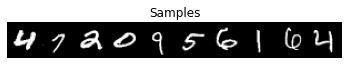

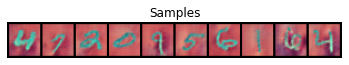

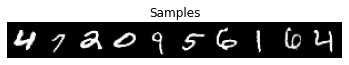

CMNIST => MINST: 


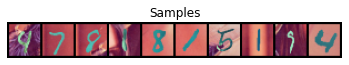

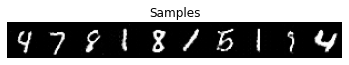

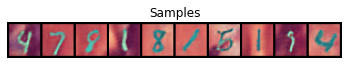


Epoch 40 - D_Loss: 0.46832272137151854, G_Loss: 2.0668008096182526
MNIST => CMINST: 


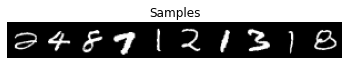

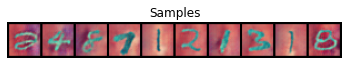

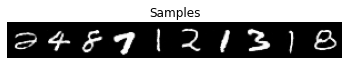

CMNIST => MINST: 


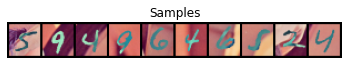

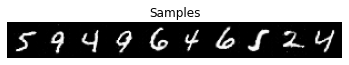

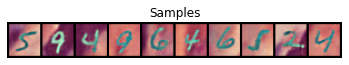


Epoch 41 - D_Loss: 0.4638993792188193, G_Loss: 2.058238537580982
MNIST => CMINST: 


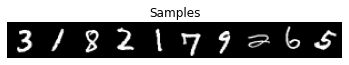

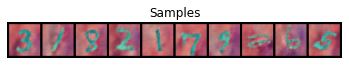

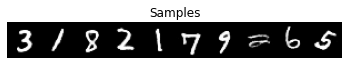

CMNIST => MINST: 


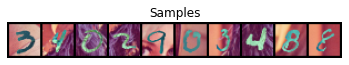

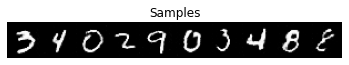

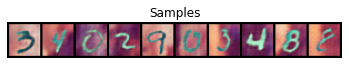


Epoch 42 - D_Loss: 0.46767525117534564, G_Loss: 2.0276532567132004
MNIST => CMINST: 


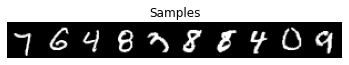

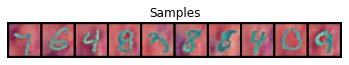

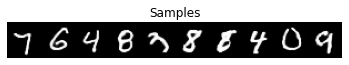

CMNIST => MINST: 


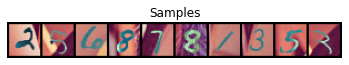

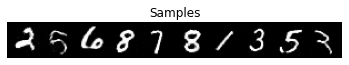

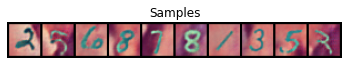


Epoch 43 - D_Loss: 0.4722691679687134, G_Loss: 2.004064991784248
MNIST => CMINST: 


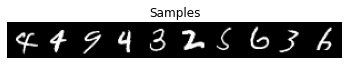

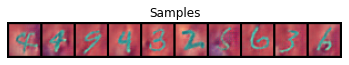

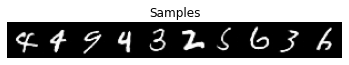

CMNIST => MINST: 


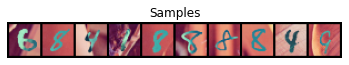

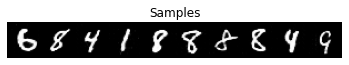

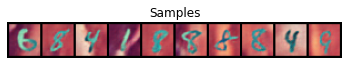


Epoch 44 - D_Loss: 0.4667343779413431, G_Loss: 1.9977420883646397
MNIST => CMINST: 


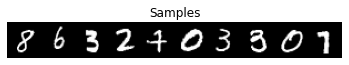

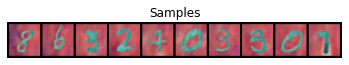

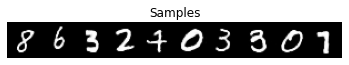

CMNIST => MINST: 


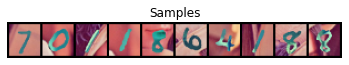

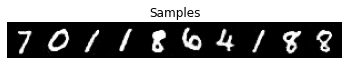

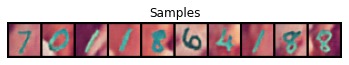


Epoch 45 - D_Loss: 0.47151018961914565, G_Loss: 1.9708610902717119
MNIST => CMINST: 


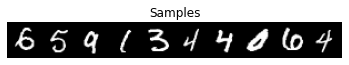

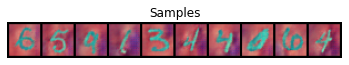

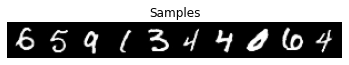

CMNIST => MINST: 


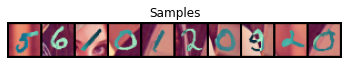

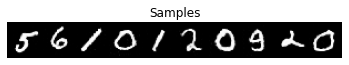

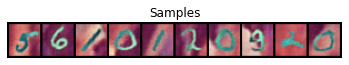


Epoch 46 - D_Loss: 0.4613788398598303, G_Loss: 1.9796057479467981
MNIST => CMINST: 


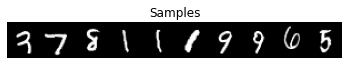

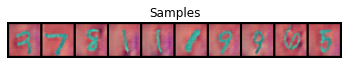

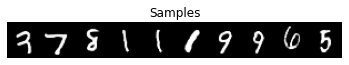

CMNIST => MINST: 


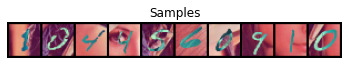

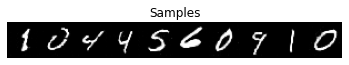

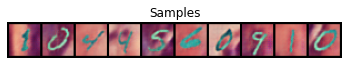


Epoch 47 - D_Loss: 0.4615651700161159, G_Loss: 1.949724723535306
MNIST => CMINST: 


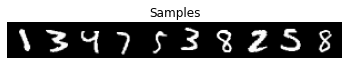

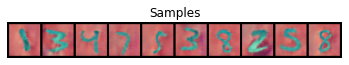

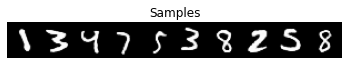

CMNIST => MINST: 


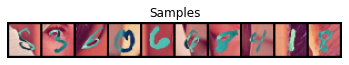

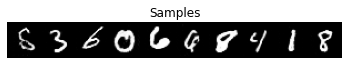

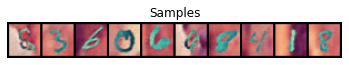


Epoch 48 - D_Loss: 0.4628337359250481, G_Loss: 1.939552628155202
MNIST => CMINST: 


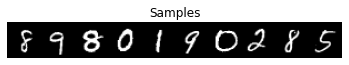

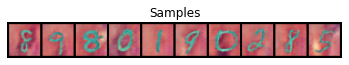

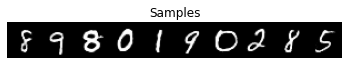

CMNIST => MINST: 


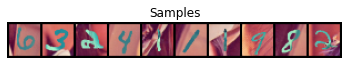

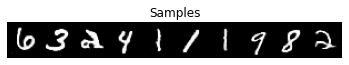

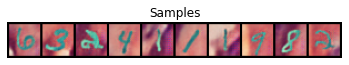


Epoch 49 - D_Loss: 0.46464880436722406, G_Loss: 1.9489032281741405
MNIST => CMINST: 


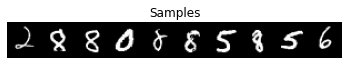

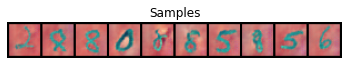

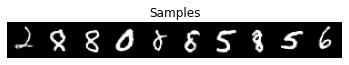

CMNIST => MINST: 


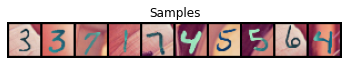

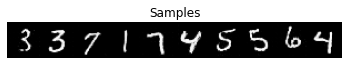

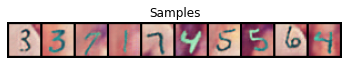


Epoch 50 - D_Loss: 0.4687251442276847, G_Loss: 1.939960975382628
MNIST => CMINST: 


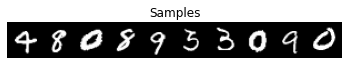

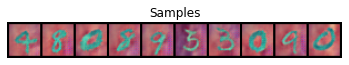

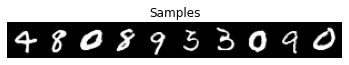

CMNIST => MINST: 


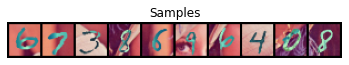

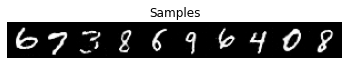

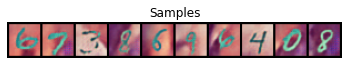


Epoch 51 - D_Loss: 0.46035201272476456, G_Loss: 1.9260939972232909
MNIST => CMINST: 


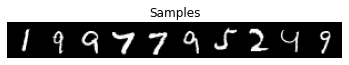

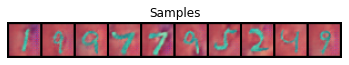

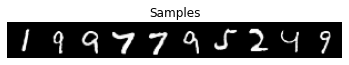

CMNIST => MINST: 


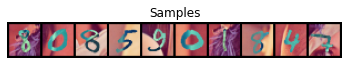

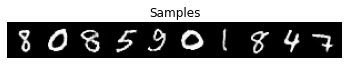

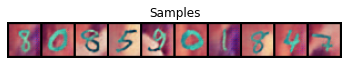


Epoch 52 - D_Loss: 0.456565978494026, G_Loss: 1.9219112431825096
MNIST => CMINST: 


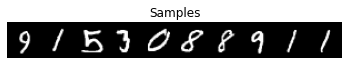

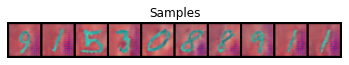

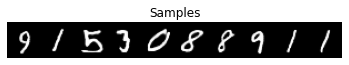

CMNIST => MINST: 


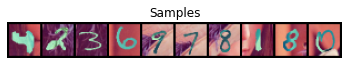

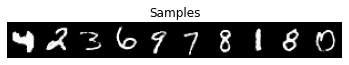

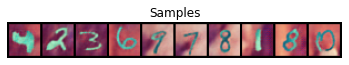


Epoch 53 - D_Loss: 0.46193710909977653, G_Loss: 1.9202084518444817
MNIST => CMINST: 


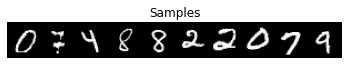

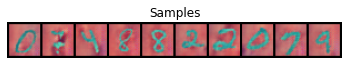

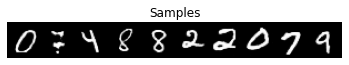

CMNIST => MINST: 


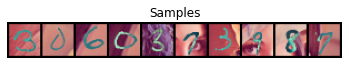

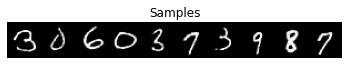

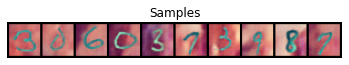


Epoch 54 - D_Loss: 0.45593887090937163, G_Loss: 1.9140357506046417
MNIST => CMINST: 


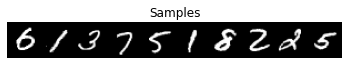

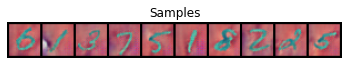

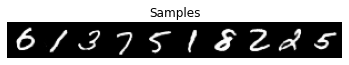

CMNIST => MINST: 


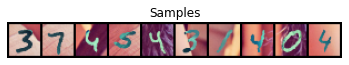

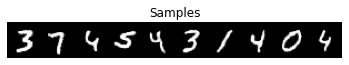

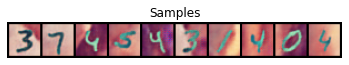


Epoch 55 - D_Loss: 0.4532941399988081, G_Loss: 1.9181928787150109
MNIST => CMINST: 


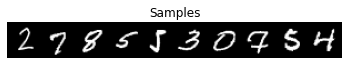

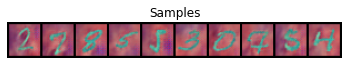

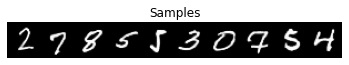

CMNIST => MINST: 


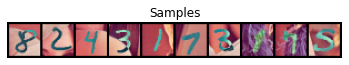

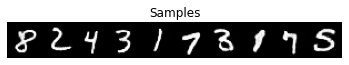

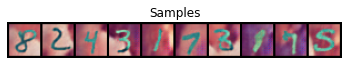


Epoch 56 - D_Loss: 0.46064151445431495, G_Loss: 1.9162251184235757
MNIST => CMINST: 


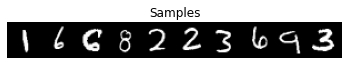

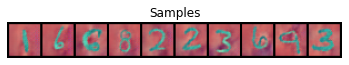

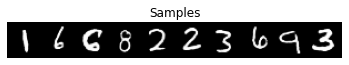

CMNIST => MINST: 


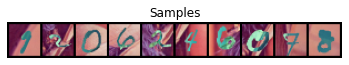

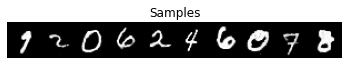

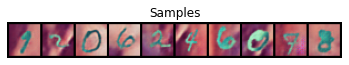


Epoch 57 - D_Loss: 0.45099021834351105, G_Loss: 1.9060629199562804
MNIST => CMINST: 


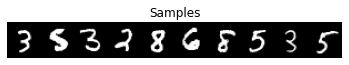

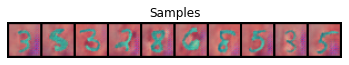

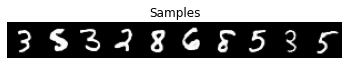

CMNIST => MINST: 


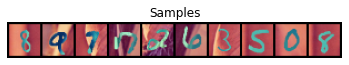

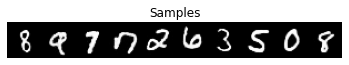

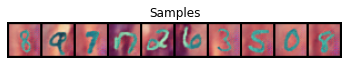


Epoch 58 - D_Loss: 0.4527993221272792, G_Loss: 1.910187540532175
MNIST => CMINST: 


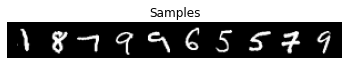

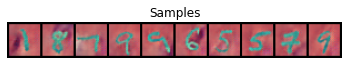

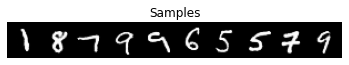

CMNIST => MINST: 


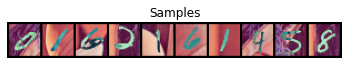

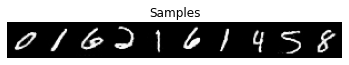

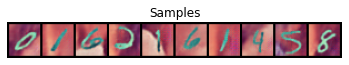


Epoch 59 - D_Loss: 0.45780716839629704, G_Loss: 1.9103803832902075
MNIST => CMINST: 


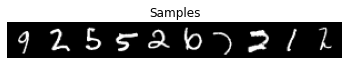

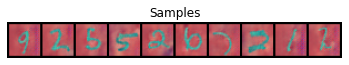

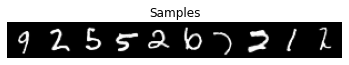

CMNIST => MINST: 


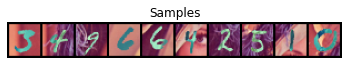

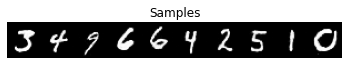

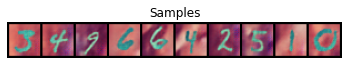


Epoch 60 - D_Loss: 0.4527228497492988, G_Loss: 1.9000117537309367
MNIST => CMINST: 


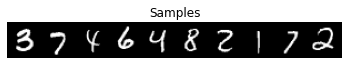

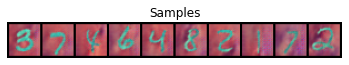

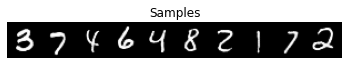

CMNIST => MINST: 


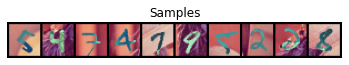

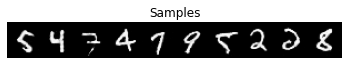

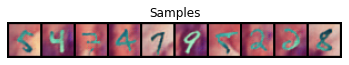


Epoch 61 - D_Loss: 0.45053437796991264, G_Loss: 1.8928500772285055
MNIST => CMINST: 


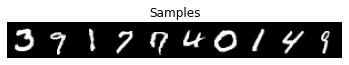

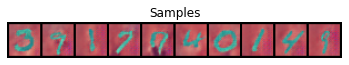

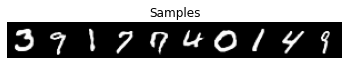

CMNIST => MINST: 


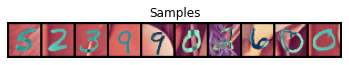

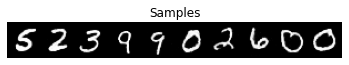

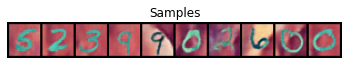


Epoch 62 - D_Loss: 0.4513349740871234, G_Loss: 1.8931087715539343
MNIST => CMINST: 


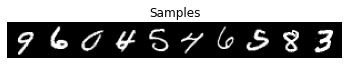

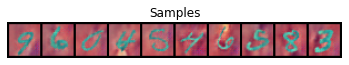

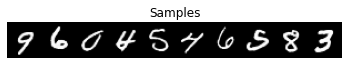

CMNIST => MINST: 


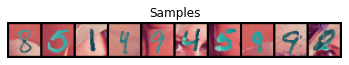

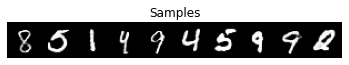

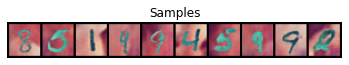


Epoch 63 - D_Loss: 0.45065960402427707, G_Loss: 1.8947448478832936
MNIST => CMINST: 


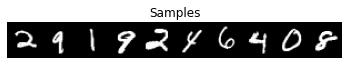

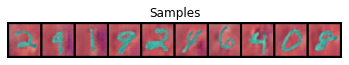

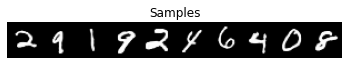

CMNIST => MINST: 


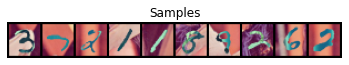

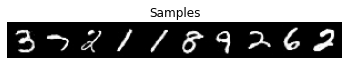

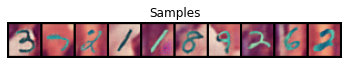


Epoch 64 - D_Loss: 0.4530563229309725, G_Loss: 1.897295469160019
MNIST => CMINST: 


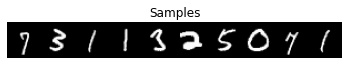

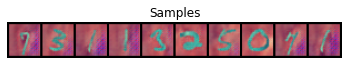

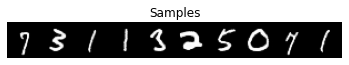

CMNIST => MINST: 


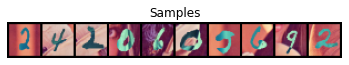

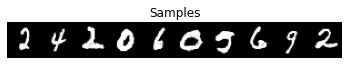

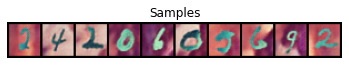


Epoch 65 - D_Loss: 0.45086273442961766, G_Loss: 1.8863540382019237
MNIST => CMINST: 


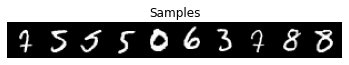

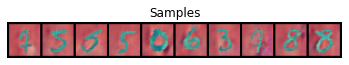

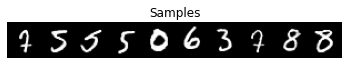

CMNIST => MINST: 


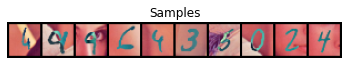

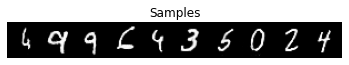

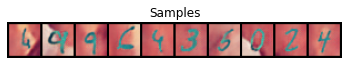


Epoch 66 - D_Loss: 0.4519868028570594, G_Loss: 1.8862759937355513
MNIST => CMINST: 


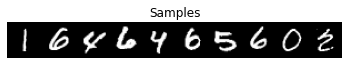

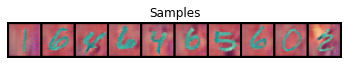

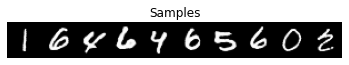

CMNIST => MINST: 


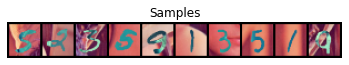

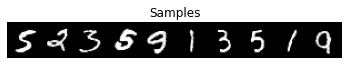

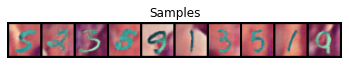


Epoch 67 - D_Loss: 0.4529143632220815, G_Loss: 1.8886847806129374
MNIST => CMINST: 


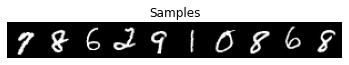

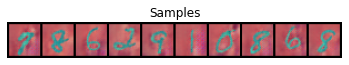

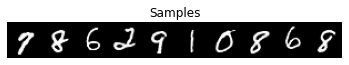

CMNIST => MINST: 


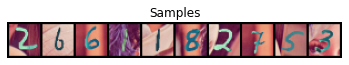

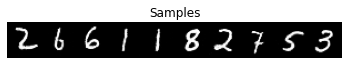

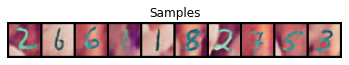


Epoch 68 - D_Loss: 0.44768099159574204, G_Loss: 1.8824793255405385
MNIST => CMINST: 


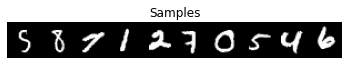

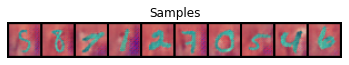

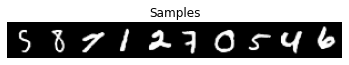

CMNIST => MINST: 


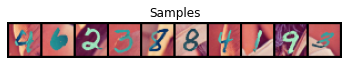

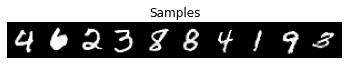

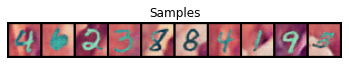


Epoch 69 - D_Loss: 0.4504377067343258, G_Loss: 1.8867492637654613
MNIST => CMINST: 


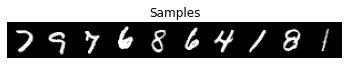

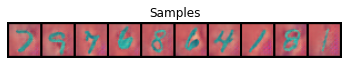

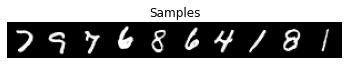

CMNIST => MINST: 


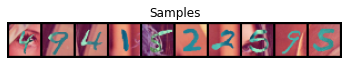

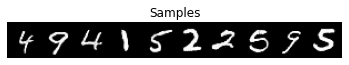

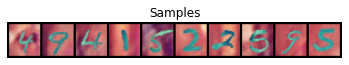


Epoch 70 - D_Loss: 0.4479087641371339, G_Loss: 1.8816001082280043
MNIST => CMINST: 


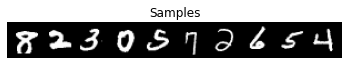

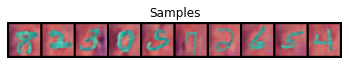

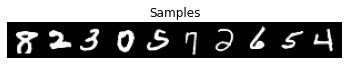

CMNIST => MINST: 


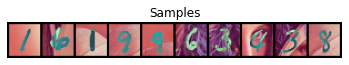

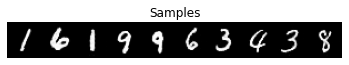

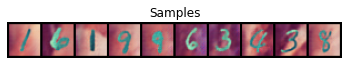


Epoch 71 - D_Loss: 0.45090409814675986, G_Loss: 1.8812202560876223
MNIST => CMINST: 


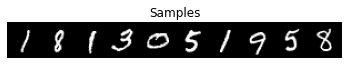

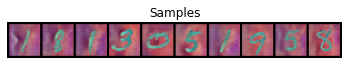

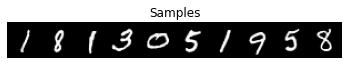

CMNIST => MINST: 


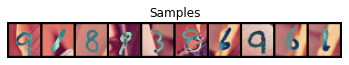

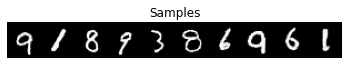

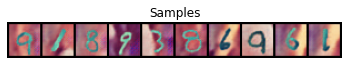


Epoch 72 - D_Loss: 0.45418596750637613, G_Loss: 1.8772052861988417
MNIST => CMINST: 


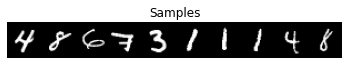

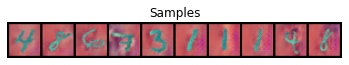

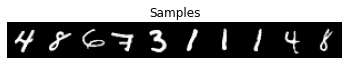

CMNIST => MINST: 


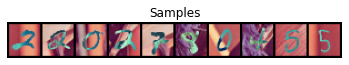

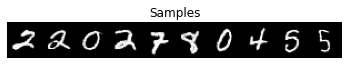

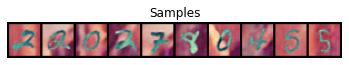


Epoch 73 - D_Loss: 0.44680335367920554, G_Loss: 1.8787734899947892
MNIST => CMINST: 


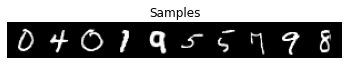

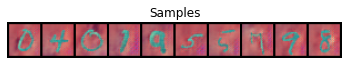

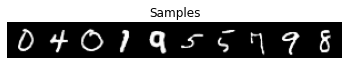

CMNIST => MINST: 


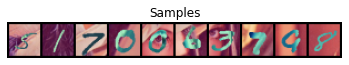

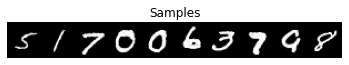

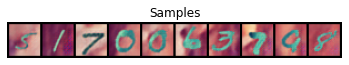


Epoch 74 - D_Loss: 0.44632601013569945, G_Loss: 1.877046670486678
MNIST => CMINST: 


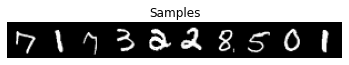

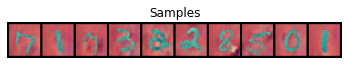

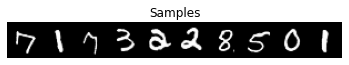

CMNIST => MINST: 


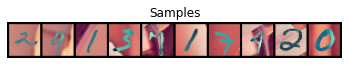

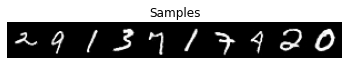

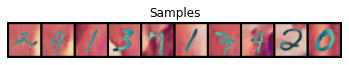


Epoch 75 - D_Loss: 0.44705286558503027, G_Loss: 1.8700276387017418
MNIST => CMINST: 


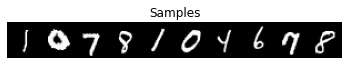

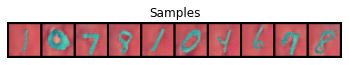

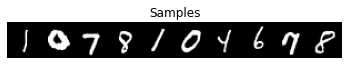

CMNIST => MINST: 


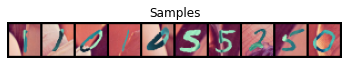

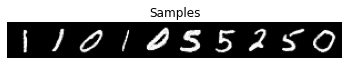

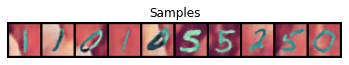


Epoch 76 - D_Loss: 0.4502850050992295, G_Loss: 1.8804307192373377
MNIST => CMINST: 


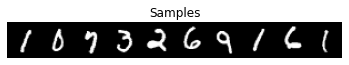

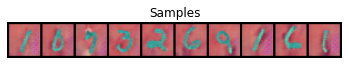

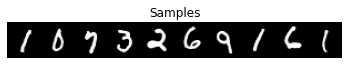

CMNIST => MINST: 


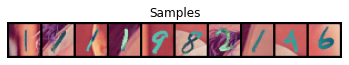

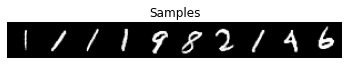

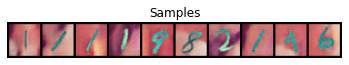


Epoch 77 - D_Loss: 0.4533029191021218, G_Loss: 1.8744716832378525
MNIST => CMINST: 


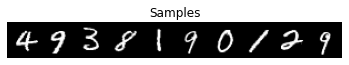

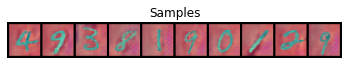

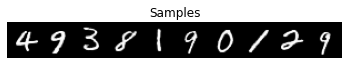

CMNIST => MINST: 


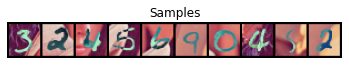

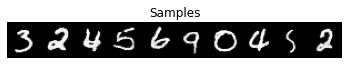

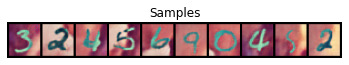


Epoch 78 - D_Loss: 0.4505777974118556, G_Loss: 1.8646447188310278
MNIST => CMINST: 


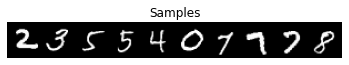

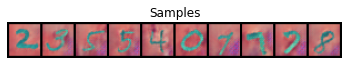

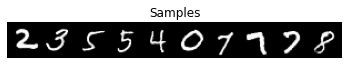

CMNIST => MINST: 


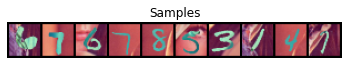

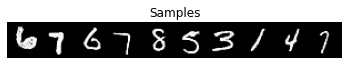

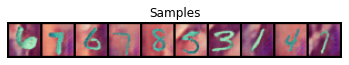


Epoch 79 - D_Loss: 0.44752217425720525, G_Loss: 1.8662507681450102
MNIST => CMINST: 


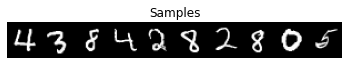

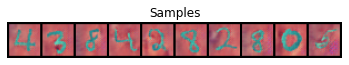

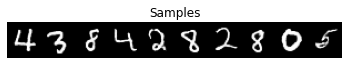

CMNIST => MINST: 


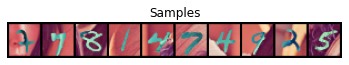

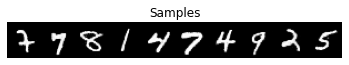

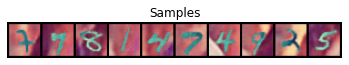


Epoch 80 - D_Loss: 0.4493867571928354, G_Loss: 1.8667831764038183
MNIST => CMINST: 


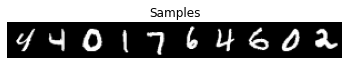

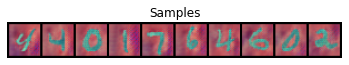

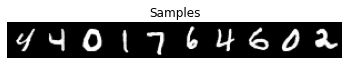

CMNIST => MINST: 


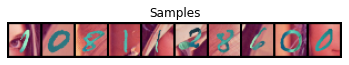

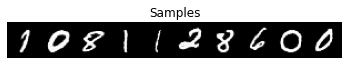

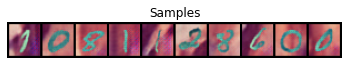


Epoch 81 - D_Loss: 0.4486495196692217, G_Loss: 1.8684826509784789
MNIST => CMINST: 


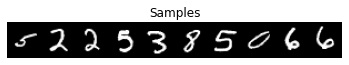

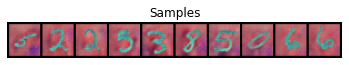

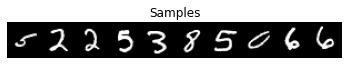

CMNIST => MINST: 


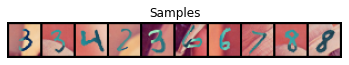

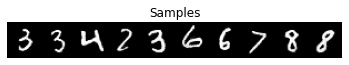

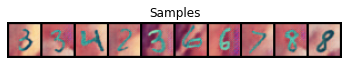


Epoch 82 - D_Loss: 0.45477554341877446, G_Loss: 1.8646601959586397
MNIST => CMINST: 


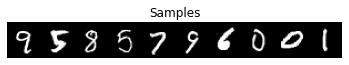

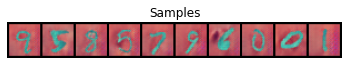

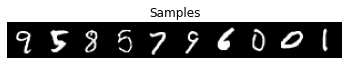

CMNIST => MINST: 


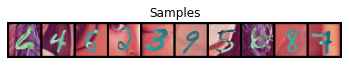

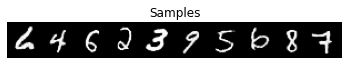

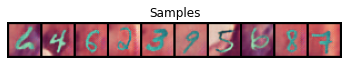


Epoch 83 - D_Loss: 0.45395699531030553, G_Loss: 1.863990250426823
MNIST => CMINST: 


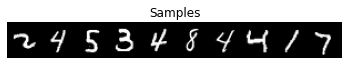

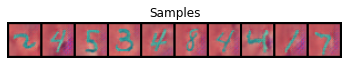

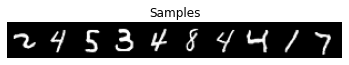

CMNIST => MINST: 


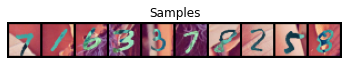

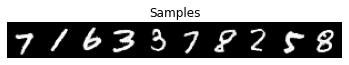

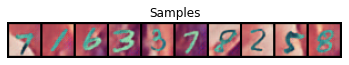


Epoch 84 - D_Loss: 0.44869057379805966, G_Loss: 1.8557199575245253
MNIST => CMINST: 


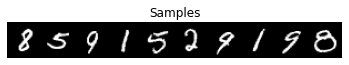

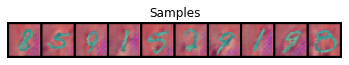

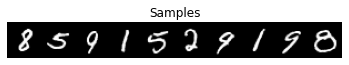

CMNIST => MINST: 


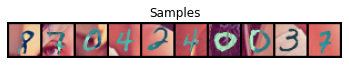

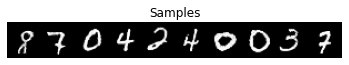

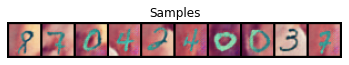


Epoch 85 - D_Loss: 0.4552326086106331, G_Loss: 1.8573768291392052
MNIST => CMINST: 


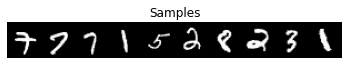

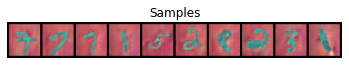

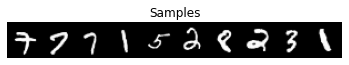

CMNIST => MINST: 


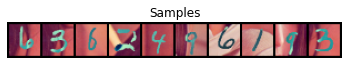

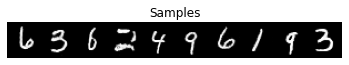

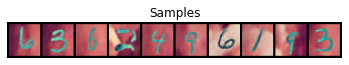


Epoch 86 - D_Loss: 0.4483543219469758, G_Loss: 1.855873075121247
MNIST => CMINST: 


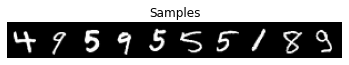

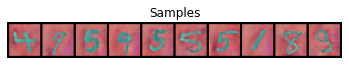

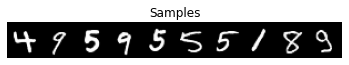

CMNIST => MINST: 


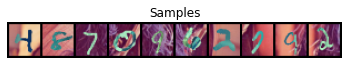

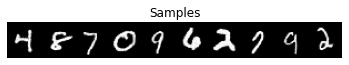

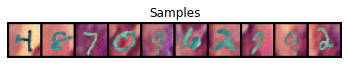


Epoch 87 - D_Loss: 0.45404557048130645, G_Loss: 1.8557940464792475
MNIST => CMINST: 


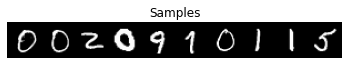

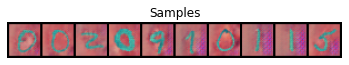

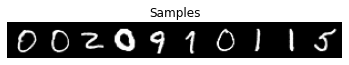

CMNIST => MINST: 


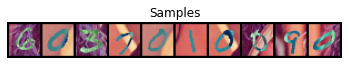

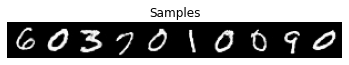

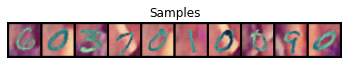


Epoch 88 - D_Loss: 0.4509820857408967, G_Loss: 1.8519124336588357
MNIST => CMINST: 


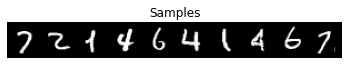

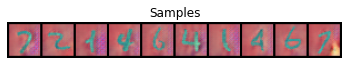

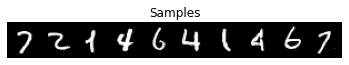

CMNIST => MINST: 


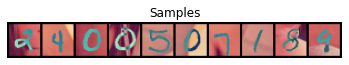

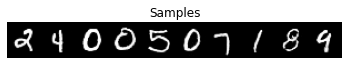

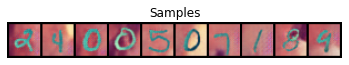


Epoch 89 - D_Loss: 0.4513403379332536, G_Loss: 1.851394385417133
MNIST => CMINST: 


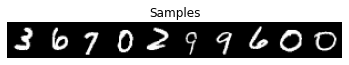

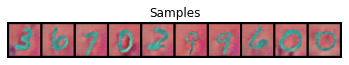

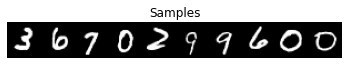

CMNIST => MINST: 


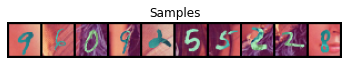

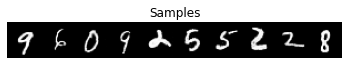

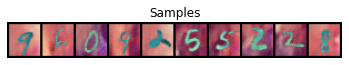


Epoch 90 - D_Loss: 0.45487458988039225, G_Loss: 1.8545653731075686
MNIST => CMINST: 


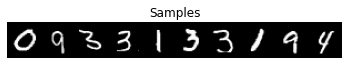

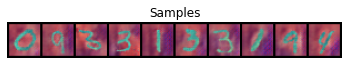

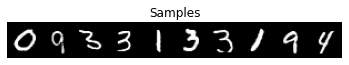

CMNIST => MINST: 


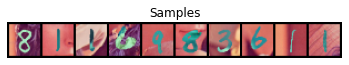

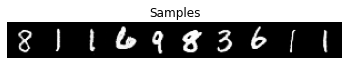

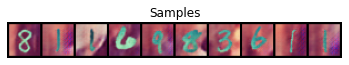


Epoch 91 - D_Loss: 0.45147890271916824, G_Loss: 1.8505418615808873
MNIST => CMINST: 


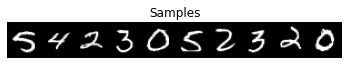

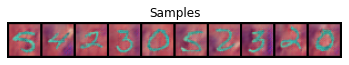

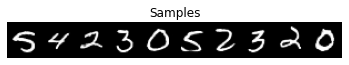

CMNIST => MINST: 


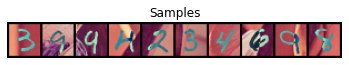

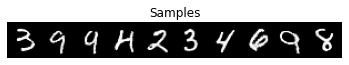

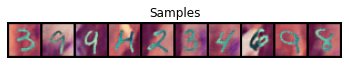


Epoch 92 - D_Loss: 0.45428910756161983, G_Loss: 1.8500469183362622
MNIST => CMINST: 


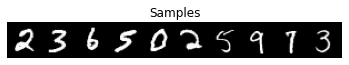

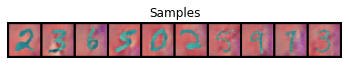

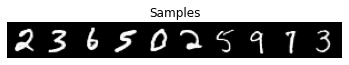

CMNIST => MINST: 


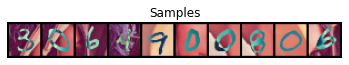

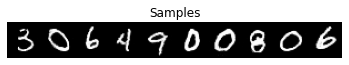

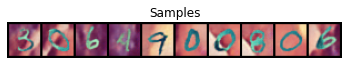


Epoch 93 - D_Loss: 0.4546743513170336, G_Loss: 1.8461515740799244
MNIST => CMINST: 


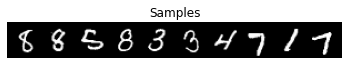

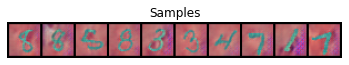

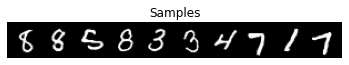

CMNIST => MINST: 


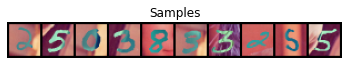

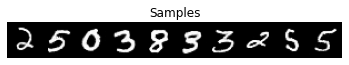

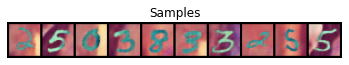


Epoch 94 - D_Loss: 0.454457432921253, G_Loss: 1.845577753174788
MNIST => CMINST: 


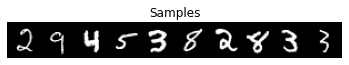

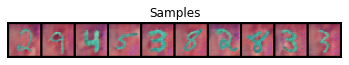

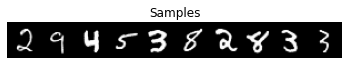

CMNIST => MINST: 


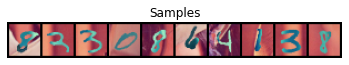

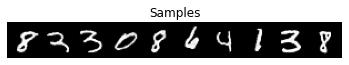

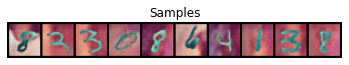


Epoch 95 - D_Loss: 0.44730078462344497, G_Loss: 1.8422298794870438
MNIST => CMINST: 


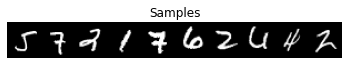

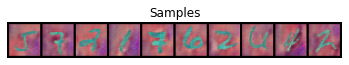

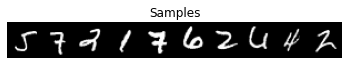

CMNIST => MINST: 


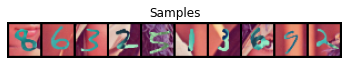

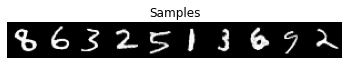

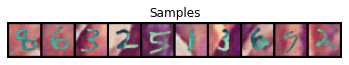


Epoch 96 - D_Loss: 0.4560282672010759, G_Loss: 1.8436769946043425
MNIST => CMINST: 


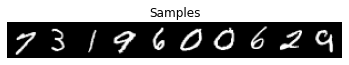

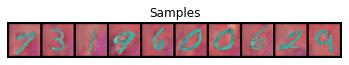

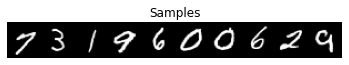

CMNIST => MINST: 


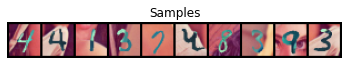

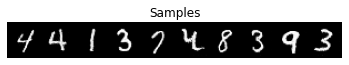

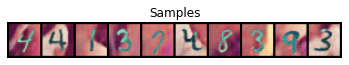


Epoch 97 - D_Loss: 0.45526615554081606, G_Loss: 1.8357498218764121
MNIST => CMINST: 


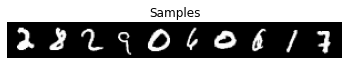

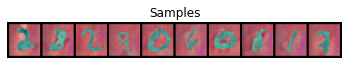

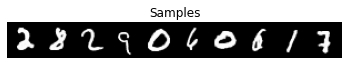

CMNIST => MINST: 


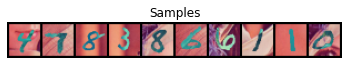

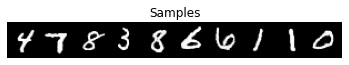

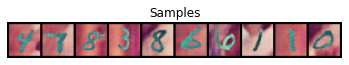


Epoch 98 - D_Loss: 0.45345696997540846, G_Loss: 1.8368906171591297
MNIST => CMINST: 


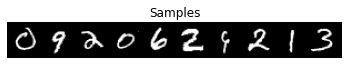

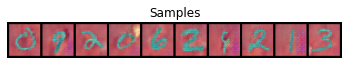

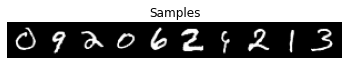

CMNIST => MINST: 


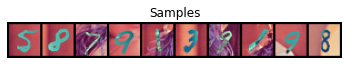

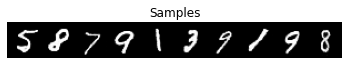

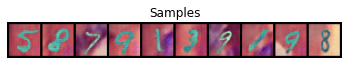


Epoch 99 - D_Loss: 0.45179179043912177, G_Loss: 1.838052610852825
MNIST => CMINST: 


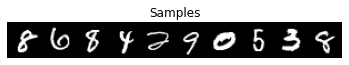

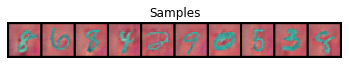

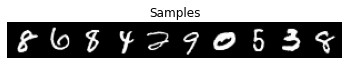

CMNIST => MINST: 


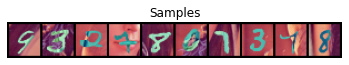

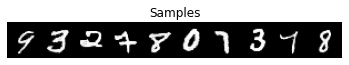

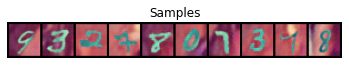


Epoch 100 - D_Loss: 0.4527154005031342, G_Loss: 1.839105251501364
MNIST => CMINST: 


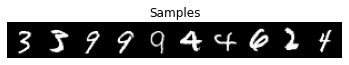

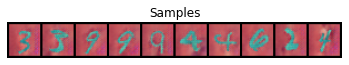

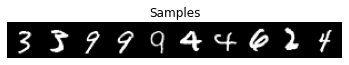

CMNIST => MINST: 


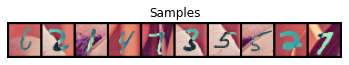

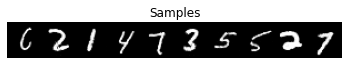

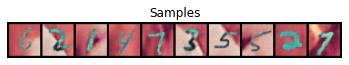

In [ ]:
cycle_gan_trainer.train(mnist_data, cminst_data, train_data_loader)

## Solution

In [ ]:
def q4(mnist_data, cmnist_data):
    """
    mnist_data: An (60000, 1, 28, 28) numpy array of black and white images with values in [0, 1]
    cmnist_data: An (60000, 3, 28, 28) numpy array of colored images with values in [0, 1]

    Returns
    - a (20, 28, 28, 1) numpy array of real MNIST digits, in [0, 1]
    - a (20, 28, 28, 3) numpy array of translated Colored MNIST digits, in [0, 1]
    - a (20, 28, 28, 1) numpy array of reconstructed MNIST digits, in [0, 1]

    - a (20, 28, 28, 3) numpy array of real Colored MNIST digits, in [0, 1]
    - a (20, 28, 28, 1) numpy array of translated MNIST digits, in [0, 1]
    - a (20, 28, 28, 3) numpy array of reconstructed Colored MNIST digits, in [0, 1]
    """
    """ YOUR CODE HERE """

## Results

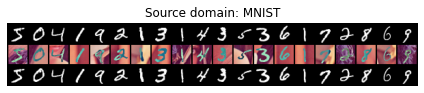

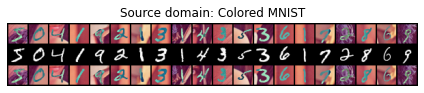

In [ ]:
q4_save_results(q4)